In [1]:
import pandas as pd
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import pandas.util.testing as tm

 

__FILE_LOC = "c:/users/hajyhass/downloads/train_test_files_sample.csv"

C:\Users\hajyhass\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df_train = pd.read_csv(__FILE_LOC,header=0)

In [3]:
df_train

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,19,20,21,22,23,24,25,26,27,28
0,1163936,1.0,0.848430,0.851195,1.723261,0.161712,-0.688872,1.038643,0.045525,0.627159,...,-0.951545,1.241732,0.000000,0.455958,0.951264,0.979708,0.929979,1.762546,0.951372,0.784570
1,153473,1.0,0.410672,-2.304464,-0.638889,0.527247,-1.053383,0.895186,-1.603208,0.307285,...,-1.144760,0.791698,3.101961,0.890829,0.959105,0.981807,0.861394,1.151072,0.784608,0.696082
2,7839500,1.0,0.709160,-0.128618,-1.454535,0.742821,-1.734547,1.343786,-0.489199,-0.091968,...,0.833195,1.613523,0.000000,1.093998,1.154499,0.981247,1.533215,1.461229,1.360782,1.142573
3,229099,1.0,1.263129,0.968071,1.659452,0.827597,1.260435,0.666443,-0.663480,0.199182,...,0.368480,0.353318,0.000000,0.725245,0.869467,0.989487,1.179879,0.942378,0.991208,0.796980
4,8797443,0.0,1.665200,0.462581,-0.157267,0.741436,0.905371,0.597279,0.097017,0.676499,...,0.466753,-0.834855,0.000000,1.036636,0.859889,1.259423,1.044747,0.629774,0.796595,0.715983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1049995,2396254,0.0,0.565681,-0.183160,1.147315,0.635010,0.475717,0.922210,0.524796,-0.132992,...,-0.173688,-0.911433,0.000000,1.165244,1.161216,0.994253,1.095904,0.596488,1.053015,0.953333
1049996,4375918,1.0,0.872404,-1.187322,0.166320,1.076443,-1.053322,0.685772,-1.590335,1.061235,...,0.545871,-0.258298,3.101961,1.300861,0.912397,1.195369,0.958216,1.148102,0.800039,0.761022
1049997,9530558,1.0,0.686101,0.232724,0.543626,1.499569,1.022965,0.568423,-0.575349,-0.661314,...,1.271260,-0.591248,0.000000,0.769734,0.888222,0.996168,0.760755,0.371719,0.698845,0.745981
1049998,3298604,0.0,1.372019,-1.207775,-1.220939,0.528946,1.380627,1.020046,-0.193120,0.716968,...,0.565859,0.090289,0.000000,0.524692,0.798694,0.986355,0.910102,1.219684,0.950956,0.768996


In [4]:
df_train.columns.to_list()

['Unnamed: 0',
 '0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28']

1.0    555950
0.0    494050
Name: 0, dtype: int64


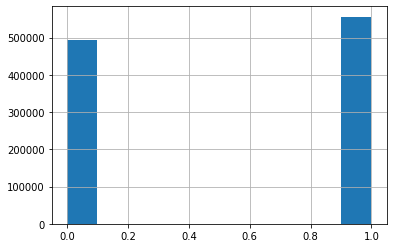

In [5]:
print(df_train["0"].value_counts())
df_train["0"].hist()

##balanced data

In [6]:
##Any columns I must drop?
df_reduced = df_train.drop(columns= ["0"])

##Is the data not standardied already?
#standardized_data = StandardScaler().fit_transform(df_reduced)

#seperating features and label
data_selected= df_reduced[:][:]
labels_selected = df_train["0"][:]
print(data_selected,labels_selected)


         Unnamed: 0         1         2         3         4         5  \
0           1163936  0.848430  0.851195  1.723261  0.161712 -0.688872   
1            153473  0.410672 -2.304464 -0.638889  0.527247 -1.053383   
2           7839500  0.709160 -0.128618 -1.454535  0.742821 -1.734547   
3            229099  1.263129  0.968071  1.659452  0.827597  1.260435   
4           8797443  1.665200  0.462581 -0.157267  0.741436  0.905371   
...             ...       ...       ...       ...       ...       ...   
1049995     2396254  0.565681 -0.183160  1.147315  0.635010  0.475717   
1049996     4375918  0.872404 -1.187322  0.166320  1.076443 -1.053322   
1049997     9530558  0.686101  0.232724  0.543626  1.499569  1.022965   
1049998     3298604  1.372019 -1.207775 -1.220939  0.528946  1.380627   
1049999     7155736  1.591813 -0.312698  0.390484  0.670584 -0.854686   

                6         7         8         9  ...        19        20  \
0        1.038643  0.045525  0.627159  2.173076

In [7]:
# taking 5000 sample data out of 1000,000 to minimize processing time

from numpy.random import uniform
indices = uniform(0,df_reduced.shape[0], 5000)
indices_list = [int(x) for x in indices]
sampled_data = df_reduced.iloc[indices_list,]
sampled_data=sampled_data.drop(columns='Unnamed: 0')
sampled_target = df_train["0"][indices_list] 
sampled_target
sampled_data


,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
749211,1.234762,0.485956,-1.396275,1.626482,0.475294,0.648579,0.073252,-0.389113,2.173076,0.331882,...,1.135510,1.625176,0.000000,0.592113,0.912809,1.949999,1.173040,0.810552,0.928743,0.785950
858125,0.554701,0.611598,-0.514042,0.771604,-1.408859,1.285707,0.184157,1.194285,2.173076,0.928790,...,0.614996,-1.319293,0.000000,0.896163,1.143508,0.981600,0.843484,1.559888,0.960096,0.813091
481527,2.484165,0.202531,-0.050733,1.729218,-0.700233,0.979648,0.479246,1.617828,0.000000,0.826682,...,1.671016,0.073642,0.000000,0.885055,0.994166,1.584200,0.890815,0.314837,0.724101,0.775677
573617,0.656820,0.136301,-0.679949,1.322464,-1.738604,0.801655,-1.065513,1.039060,0.000000,0.370408,...,-0.172855,-1.353697,3.101961,0.596459,1.031375,1.052426,0.808546,0.720296,0.700627,0.735246
792982,0.928039,-0.026351,1.385350,0.530807,0.164759,0.485335,-0.317889,-0.423484,2.173076,1.018811,...,0.581683,-0.202807,0.000000,0.811666,0.795249,0.984077,1.071197,0.923329,0.927982,0.812602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440422,0.852273,-0.684754,-1.508912,0.637944,1.626195,0.560545,0.800080,-0.044846,0.000000,0.475412,...,-0.423535,0.377734,3.101961,1.237677,0.875728,0.991796,0.855574,0.592830,0.634302,0.812837
719177,1.105192,-0.504570,-1.562178,0.828209,-0.295915,0.341603,-2.085450,1.245288,0.000000,0.475034,...,-0.480167,-0.787687,1.550981,0.946760,0.952477,1.205371,0.595459,0.631943,0.614721,0.604408
333225,0.539511,-0.435418,-0.030758,0.960377,-1.258491,1.175137,-0.058449,1.078975,0.000000,0.785134,...,-0.497656,-0.281605,3.101961,0.827252,0.874592,0.991650,0.697379,0.848966,0.877275,0.766788
198294,1.131911,-1.369454,0.436538,0.719555,1.255951,1.093149,0.093056,-0.613084,2.173076,0.573868,...,0.570856,1.292784,3.101961,1.574979,0.857568,0.988292,1.336870,0.882102,0.939802,1.078964


In [8]:
#### Applying the same concept on targets

 

df_index = df_train.index[df_train["0"]==1].to_list()

print("Size of the file is %d"%len(df_index))

sample_data = df_reduced.iloc[df_index]

Size of the file is 555950


In [9]:
import catboost as cb

import gc

from hyperopt import hp, tpe, Trials, STATUS_OK

from hyperopt.fmin import fmin

from hyperopt.pyll.stochastic import sample

 
import warnings

warnings.filterwarnings('ignore')

 

#GLOBAL HYPEROPT PARAMETERS

NUM_EVALS = 10 #number of hyperopt evaluation rounds

N_FOLDS = 5 #number of cross-validation folds on data in each evaluation round

 

#CATBOOST PARAMETERS

CB_MAX_DEPTH = 8 #maximum tree depth in CatBoost

OBJECTIVE_CB_REG = 'MAE' #CatBoost regression metric

OBJECTIVE_CB_CLASS = 'Logloss' #CatBoost classification metric

 

#OPTIONAL OUTPUT

BEST_SCORE = 0


In [10]:
gc.collect()

20

In [29]:
def quick_hyperopt(sampled_data, sampled_target, num_evals=NUM_EVALS, diagnostic=False):

    """

    Hyper Parameter Optimization

    

    """

        

    print('Running {} rounds of CatBoost parameter optimisation:'.format(num_evals))

 

    #clear memory 

    gc.collect()

 

    integer_params = ['depth',

                      #'one_hot_max_size', #for categorical data

                      'min_data_in_leaf',

                      'max_bin']

 

    def objective(space_params):

 

        #cast integer params from float to int

        for param in integer_params:

            space_params[param] = int(space_params[param])

 

        #extract nested conditional parameters

        if space_params['bootstrap_type']['bootstrap_type'] == 'Bayesian':

            bagging_temp = space_params['bootstrap_type'].get('bagging_temperature')

            space_params['bagging_temperature'] = bagging_temp

 

        if space_params['grow_policy']['grow_policy'] == 'LossGuide':

            max_leaves = space_params['grow_policy'].get('max_leaves')

            space_params['max_leaves'] = int(max_leaves)

 

        space_params['bootstrap_type'] = space_params['bootstrap_type']['bootstrap_type']

        space_params['grow_policy'] = space_params['grow_policy']['grow_policy']

 

        #random_strength cannot be < 0

        space_params['random_strength'] = max(space_params['random_strength'], 0)

        #fold_len_multiplier cannot be < 1

        space_params['fold_len_multiplier'] = max(space_params['fold_len_multiplier'], 1)

 

        #for classification set stratified=True

        cv_results = cb.cv(train, space_params, fold_count=N_FOLDS,

                         early_stopping_rounds=25, stratified=True, partition_random_seed=42, plot=True)

 

        #best_loss = cv_results['test-MAE-mean'].iloc[-1] #'test-RMSE-mean' for RMSE

        #for classification, comment out the line above and uncomment the line below:

        best_loss = cv_results['test-TotalF1-mean'].iloc[-1]

        #if necessary, replace 'test-Logloss-mean' with 'test-[your-preferred-metric]-mean'

 

        return{'loss':best_loss, 'status': STATUS_OK}

 

    train = cb.Pool(sampled_data, sampled_target.astype('float32'))

 

    #integer and string parameters, used with hp.choice()

    bootstrap_type = [ {'bootstrap_type':'Bayesian',

                        'bagging_temperature' : hp.loguniform('bagging_temperature', np.log(1), np.log(50))},

                      {'bootstrap_type':'Bernoulli'}] 

 

    LEB = ['No', 'AnyImprovement'] #remove 'Armijo' if not using GPU

    score_function = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2']

    grow_policy = [{'grow_policy':'SymmetricTree'},

                   {'grow_policy':'Depthwise'},

                   {'grow_policy':'Lossguide',

                    'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]

    eval_metric_list_reg = ['MAE', 'RMSE', 'Poisson']

    eval_metric_list_class = ['F1','AUC']

    #for classification change line below to 'eval_metric_list = eval_metric_list_class'

    eval_metric_list = eval_metric_list_class

 

    space ={'depth': hp.quniform('depth', 2, CB_MAX_DEPTH, 1),

            'max_bin' : hp.quniform('max_bin', 254, 254, 1), #if using CPU just set this to 254

            'l2_leaf_reg' : hp.uniform('l2_leaf_reg', 0, 5),

            'min_data_in_leaf' : hp.quniform('min_data_in_leaf', 1, 50, 1),

            'random_strength' : hp.loguniform('random_strength', np.log(0.005), np.log(5)),

            #'one_hot_max_size' : hp.quniform('one_hot_max_size', 2, 16, 1), #uncomment if using categorical features

            'bootstrap_type' : hp.choice('bootstrap_type', bootstrap_type),

            'learning_rate' : hp.uniform('learning_rate', 0.05, 0.25),

            'eval_metric' : hp.choice('eval_metric', eval_metric_list),

            'objective' : OBJECTIVE_CB_CLASS,

            #'score_function' : hp.choice('score_function', score_function), #crashes kernel - reason unknown

            'leaf_estimation_backtracking' : hp.choice('leaf_estimation_backtracking', LEB),

            'grow_policy': hp.choice('grow_policy', grow_policy),

            'colsample_bylevel' : hp.quniform('colsample_bylevel', 0.1, 1, 0.01),# CPU only

            'fold_len_multiplier' : hp.loguniform('fold_len_multiplier', np.log(1.01), np.log(2.5)),

            'od_type' : 'Iter',

            'od_wait' : 25,

            'task_type' : 'CPU',

            'verbose' : 0

        }

 

 

    trials = Trials()

    best = fmin(fn=objective,

                space=space,

                algo=tpe.suggest,

                max_evals=num_evals, 

                trials=trials)

 

    #unpack nested dicts first

    best['bootstrap_type'] = bootstrap_type[best['bootstrap_type']]['bootstrap_type']

    best['grow_policy'] = grow_policy[best['grow_policy']]['grow_policy']

    best['eval_metric'] = eval_metric_list[best['eval_metric']]

 

    #best['score_function'] = score_function[best['score_function']]

    #best['leaf_estimation_method'] = LEM[best['leaf_estimation_method']] #CPU only

    best['leaf_estimation_backtracking'] = LEB[best['leaf_estimation_backtracking']]       

 

    #cast floats of integer params to int

    for param in integer_params:

        best[param] = int(best[param])

    if 'max_leaves' in best:

        best['max_leaves'] = int(best['max_leaves'])

 

    print('{' + '\n'.join('{}: {}'.format(k, v) for k, v in best.items()) + '}')

 

    if diagnostic:

        return(best, trials)

    else:

        return(best)

    

 

quick_hyperopt(sampled_data, sampled_target) 

Running 10 rounds of CatBoost parameter optimisation:
  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

job exception: 'test-TotalF1-mean'



  0%|          | 0/10 [00:31<?, ?trial/s, best loss=?]


KeyError: 'test-TotalF1-mean'

In [11]:
df_train.columns

Index(['Unnamed: 0', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '27', '28'],
      dtype='object')

In [12]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
#train_cols = [col for col in df_train.columns if col not in ["0"]]
train_cols = [col for col in sampled_data.columns]
X_train, X_test, y_train, y_test = train_test_split(sampled_data[train_cols], sampled_target, test_size=0.33, random_state=42,stratify=sampled_target.values)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.33,random_state=42, stratify=y_train.values)
#model.fit(sampled_data[train_cols],sampled_target)
#sampled_target

In [13]:
#Random Sample Model

model = CatBoostClassifier(iterations=198,learning_rate=0.5,custom_loss = ['AUC','F1'],depth=5)
model.fit(X_train,y_train,eval_set=(X_val,y_val),plot="True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6462758	test: 0.6487790	best: 0.6487790 (0)	total: 102ms	remaining: 20s
1:	learn: 0.6140490	test: 0.6246542	best: 0.6246542 (1)	total: 120ms	remaining: 11.7s
2:	learn: 0.6024725	test: 0.6164180	best: 0.6164180 (2)	total: 134ms	remaining: 8.7s
3:	learn: 0.5872905	test: 0.6142471	best: 0.6142471 (3)	total: 147ms	remaining: 7.11s
4:	learn: 0.5759769	test: 0.6143983	best: 0.6142471 (3)	total: 155ms	remaining: 5.99s
5:	learn: 0.5681058	test: 0.6144533	best: 0.6142471 (3)	total: 162ms	remaining: 5.19s
6:	learn: 0.5597146	test: 0.6096062	best: 0.6096062 (6)	total: 171ms	remaining: 4.68s
7:	learn: 0.5518565	test: 0.6079932	best: 0.6079932 (7)	total: 179ms	remaining: 4.25s
8:	learn: 0.5472936	test: 0.6092646	best: 0.6079932 (7)	total: 187ms	remaining: 3.93s
9:	learn: 0.5395351	test: 0.6063187	best: 0.6063187 (9)	total: 194ms	remaining: 3.65s
10:	learn: 0.5290560	test: 0.6084262	best: 0.6063187 (9)	total: 204ms	remaining: 3.47s
11:	learn: 0.5170401	test: 0.6107514	best: 0.6063187 (9)

95:	learn: 0.1049345	test: 0.7496594	best: 0.6063187 (9)	total: 868ms	remaining: 923ms
96:	learn: 0.1027507	test: 0.7531633	best: 0.6063187 (9)	total: 879ms	remaining: 915ms
97:	learn: 0.1002198	test: 0.7534310	best: 0.6063187 (9)	total: 886ms	remaining: 904ms
98:	learn: 0.0988845	test: 0.7519742	best: 0.6063187 (9)	total: 892ms	remaining: 892ms
99:	learn: 0.0978910	test: 0.7532731	best: 0.6063187 (9)	total: 899ms	remaining: 881ms
100:	learn: 0.0968698	test: 0.7543347	best: 0.6063187 (9)	total: 908ms	remaining: 872ms
101:	learn: 0.0958191	test: 0.7552559	best: 0.6063187 (9)	total: 917ms	remaining: 863ms
102:	learn: 0.0942811	test: 0.7567470	best: 0.6063187 (9)	total: 925ms	remaining: 853ms
103:	learn: 0.0923919	test: 0.7609474	best: 0.6063187 (9)	total: 931ms	remaining: 841ms
104:	learn: 0.0905381	test: 0.7602163	best: 0.6063187 (9)	total: 939ms	remaining: 832ms
105:	learn: 0.0898508	test: 0.7609561	best: 0.6063187 (9)	total: 945ms	remaining: 820ms
106:	learn: 0.0881247	test: 0.7627962

189:	learn: 0.0282685	test: 0.8366466	best: 0.6063187 (9)	total: 1.67s	remaining: 70.5ms
190:	learn: 0.0279138	test: 0.8357200	best: 0.6063187 (9)	total: 1.68s	remaining: 61.7ms
191:	learn: 0.0275950	test: 0.8374277	best: 0.6063187 (9)	total: 1.69s	remaining: 52.9ms
192:	learn: 0.0272943	test: 0.8377298	best: 0.6063187 (9)	total: 1.7s	remaining: 44ms
193:	learn: 0.0269728	test: 0.8421864	best: 0.6063187 (9)	total: 1.71s	remaining: 35.3ms
194:	learn: 0.0267428	test: 0.8426315	best: 0.6063187 (9)	total: 1.72s	remaining: 26.4ms
195:	learn: 0.0265395	test: 0.8435796	best: 0.6063187 (9)	total: 1.73s	remaining: 17.6ms
196:	learn: 0.0261057	test: 0.8476846	best: 0.6063187 (9)	total: 1.74s	remaining: 8.81ms
197:	learn: 0.0259140	test: 0.8478831	best: 0.6063187 (9)	total: 1.74s	remaining: 0us

bestTest = 0.6063186738
bestIteration = 9

Shrink model to first 10 iterations.


In [14]:
cat_features = list(range(0, sampled_data.shape[1]))

from catboost import *
Pool(data=sampled_data, label=sampled_target)
#Pool(X_val, y_val,cat_features=cat_features)
from catboost.utils import get_roc_curve
import sklearn
from sklearn import metrics

In [15]:
from catboost.utils import get_fpr_curve, get_fnr_curve,get_roc_curve
eval_pool = Pool(data=sampled_data, label=sampled_target)
curve = get_roc_curve(model, eval_pool)


(threshold, fpr) = get_fpr_curve(curve=curve)

(threshold, fnr) = get_fnr_curve(curve=curve)

Text(0.5, 0, 'FPR-FNR')

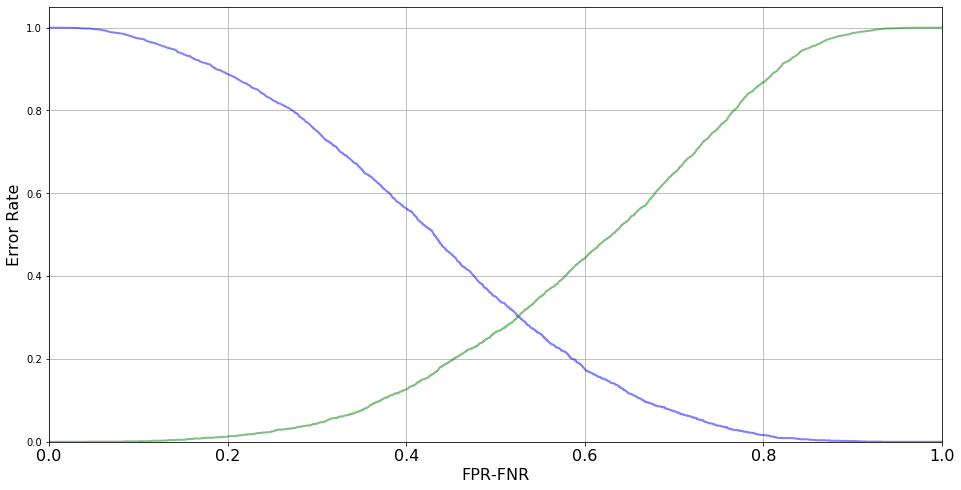

In [16]:
plt.figure(figsize=(16,8))

lw = 2

plt.plot(threshold, fpr, color='blue', lw=lw, label="FPR", alpha=0.5)

plt.plot(threshold, fnr, color='green', lw=lw, label="FNR", alpha=0.5)

 

plt.xlim([0.0,1.0])

plt.ylim([0.0,1.05])

plt.xticks(fontsize=16)

plt.grid(True)

plt.ylabel('Error Rate', fontsize=16)

plt.xlabel('FPR-FNR', fontsize=16)

In [28]:
import catboost as cb
from catboost import *
import gc
from hyperopt import hp, tpe, Trials, STATUS_OK
from hyperopt.fmin import fmin
from hyperopt.pyll.stochastic import sample
import warnings
warnings.filterwarnings('ignore')
#GLOBAL HYPEROPT PARAMETERS
NUM_EVALS = 10 #number of hyperopt evaluation rounds
N_FOLDS = 5 #number of cross-validation folds on data in each evaluation round
#CATBOOST PARAMETERS
CB_MAX_DEPTH = 16 #maximum tree depth in CatBoost
OBJECTIVE_CB_REG = 'MAE' #CatBoost regression metric
OBJECTIVE_CB_CLASS = 'Logloss' #CatBoost classification metric
#OPTIONAL OUTPUT
BEST_SCORE = 0











In [16]:
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK


from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score


def hyperopt_objective(params):
    model = CatBoostClassifier(
        l2_leaf_reg=int(params['l2_leaf_reg']),
        learning_rate=params['learning_rate'],
        iterations=params['n_estimators'], ##is identical to n_estimators in catboost
        #eval_metric='Precision',
        loss_function='Logloss',
        #n_estimators=space['n_estimators'],
        depth=int(params['depth']),
        border_count=params['border_count'],
        rsm=params['rsm'],
        od_type=params['od_type'],
        use_best_model=True,
        eval_metric='TotalF1',
        scale_pos_weight = np.sqrt(sum(y_train==0)/sum(y_train==1)),
        verbose=False,
        random_seed=123)
    
    cv_data = cv(Pool(sampled_data, sampled_target), model.get_params())
    best_TotalF1 = np.max(cv_data['test-TotalF1-mean'])
    return 1 - best_TotalF1 # as hyperopt minimises

from numpy.random import RandomState

params_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform("depth", 1, 16, 1),
    'border_count': hp.quniform('border_count', 32, 255, 1),
    #'learning_rate': hp.loguniform('learning_rate', -5.0, -2),
    'rsm': hp.uniform('rsm', 0.1,1),
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'n_estimators': hp.choice('n_estimators', [25,50])
}

trials = Trials()

best = fmin(
    hyperopt_objective,
    space=params_space,
    algo=tpe.suggest,
    max_evals=5,
    trials=trials,
    rstate=RandomState(123)
)

print(best)



100%|██████████| 5/5 [01:26<00:00, 17.29s/trial, best loss: 0.32455277311711506]
{'border_count': 39.0, 'depth': 7.0, 'l2_leaf_reg': 1.0, 'learning_rate': 0.08191953850595643, 'n_estimators': 0, 'od_type': 0, 'rsm': 0.7061295288495919}


In [17]:
trials.results

[{'loss': 0.35269015613555565, 'status': 'ok'},
 {'loss': 0.3304430253294548, 'status': 'ok'},
 {'loss': 0.3409403074267916, 'status': 'ok'},
 {'loss': 0.32455277311711506, 'status': 'ok'},
 {'loss': 0.3266422304082486, 'status': 'ok'}]

## Below, Tuning with the optimal parameters

In [21]:


model = CatBoostClassifier(
    l2_leaf_reg=1,
    learning_rate=0.31909541069093417,
    iterations=25, ##is identical to n_estimators in catboost
    loss_function='Logloss',
    depth=7,
    border_count=39,
    rsm=0.7061295288495919,
    use_best_model=True,
    od_type='IncToDec',
    eval_metric='TotalF1',
    scale_pos_weight = np.sqrt(sum(y_train==0)/sum(y_train==1)),
    verbose=False,
    random_seed=123)
    
    
model.fit(X_train, y_train, plot=True,eval_set=(X_val,y_val), verbose=False) 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [22]:
from sklearn.metrics import f1_score, precision_score, recall_score,classification_report
ypred=model.predict(X_val)
ypred

#print(classification_report(y_val,ypred, output_dict=True)['0']['f1-score'])
print(classification_report(y_val, ypred))

              precision    recall  f1-score   support

         0.0       0.67      0.64      0.65       512
         1.0       0.70      0.73      0.71       594

    accuracy                           0.69      1106
   macro avg       0.69      0.68      0.68      1106
weighted avg       0.69      0.69      0.69      1106



## Below, another example of a baseline model

In [23]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=100,
    learning_rate=0.1,
    custom_metric=['Accuracy'],
    loss_function='CrossEntropy',#CrossEntropy #MultiClass #Logloss
)
model.fit(
    X_train, y_train,
    eval_set=(X_val, y_val),
    verbose=False
)
print('Model is fitted: ' + str(model.is_fitted()))
print('Model params:')
print(model.get_params())

Model is fitted: True
Model params:
{'iterations': 100, 'learning_rate': 0.1, 'loss_function': 'CrossEntropy', 'custom_metric': ['Accuracy']}


## Below, unsuccessful attempt at Object Oriented

In [24]:
from catboost import CatBoostClassifier
from catboost import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from numpy.random import RandomState
train_cols = [col for col in df_train.columns if col not in ["0"]]


class CatBoost:
    def __init__(self, sampled_data, sampled_target,params_space):
        self.sampled_data = sampled_data
        self.sampled_target = sampled_target
        #self.params_space=params_space
        
        # self.params=params_space
    #reundant
    def TrainTestSplit(self):
        # values=self.params
        # print(type(values))
        # print(values['l2_leaf_reg'])
        X_train, X_test, y_train, y_test = train_test_split(
            self.sampled_data[train_cols], self.sampled_target, test_size=0.33, random_state=42, stratify=self.sampled_target.values)
        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(
            X_train, y_train, test_size=0.33, random_state=42, stratify=y_train.values)
        print(self.X_train)

    # def CatBooster(self):
     #   model = CatBoostClassifier(iterations=100,learning_rate=0.1,custom_metric=['Accuracy'],loss_function='CrossEntropy')#CrossEntropy #MultiClass #Logloss
      #  model.fit(X_train, y_train,eval_set=(X_val, y_val),verbose=False)
       # print('Model is fitted: ' + str(model.is_fitted()))
        # print('Model params:')
        # return model.get_params()
    
    
    def func(self):

        trials = Trials()

        self.best = fmin(
            hyperopt_objective,
            space=params_space,
            algo=tpe.suggest,
            max_evals=7,
            trials=trials,
            rstate=RandomState(123)
        )
        
        print(self.best)
        return self.best

    def tuner(self):
        
        self.tuned_model = CatBoostClassifier(
            l2_leaf_reg=int(self.best['l2_leaf_reg']),
            learning_rate=self.best['learning_rate'],
            # is identical to n_estimators in catboost
            iterations=self.best['n_estimators'],
            
            # eval_metric='Precision',
            loss_function='Logloss',
            # n_estimators=space['n_estimators'],
            depth=int(self.best['depth']),
            border_count=self.best['border_count'],
            rsm=self.best['rsm'],
            #od_type=self.best['od_type'],
            use_best_model=True,
            eval_metric='TotalF1',
            # scale_pos_weight=np.sqrt(sum(y_train == 0)/sum(y_train == 1)),
            verbose=False,
            random_seed=123)
        print(self.tuned_model)
        return (self.tuned_model)

    def predictor(self):
        
        self.tuned_model.fit(self.X_train, self.y_train,eval_set=(self.X_val,self.y_val))

    # ypred = model.predict(X_validation)
        self.y_pred = self.tuned_model.predict(self.X_val)
        #self.conf_mat=confusion_matrix(self.sampled_target, self.y_pred)
        #print('Confusion_Matrix', self.conf_mat)
        return self.y_pred
    #def storage(self):

    def hyperopt_objective(self):
        # self.params=params_space
        model = CatBoostClassifier(
            l2_leaf_reg=int(params_space['l2_leaf_reg']),
            learning_rate=params_space['learning_rate'],
            # is identical to n_estimators in catboost
            iterations=params_space['n_estimators'],
            # eval_metric='Precision',
            loss_function='Logloss',
            #n_estimators=space['n_estimators'],
            #n_estimators=50,
            depth=int(params_space['depth']),
            border_count=params_space['border_count'],
            rsm=params_space['rsm'],
            od_type=params_space['od_type'],
            use_best_model=True,
            eval_metric='TotalF1',
            # scale_pos_weight=np.sqrt(sum(y_train == 0)/sum(y_train == 1)),
            verbose=False,
            random_seed=123)

        cv_data = cv(
            Pool(self.X_train, self.y_train), model.get_params())
        best_TotalF1 = np.max(cv_data['test-TotalF1-mean'])
        return 1 - best_TotalF1  # as hyperopt minimises


params_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform("depth", 1, 16, 1),
    'border_count': hp.quniform('border_count', 32, 255, 1),
    # 'learning_rate': hp.loguniform('learning_rate', -5.0, -2),
    'rsm': hp.uniform('rsm', 0.1, 1),
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'n_estimators': hp.choice('n_estimators', [25, 50])
    
}

m = CatBoost(sampled_data, sampled_target)
#m.func()

model_params = m.func()
m.tuner()
m.TrainTestSplit()
m.hyperopt_objective()
#m.predictor()







100%|██████████| 7/7 [02:25<00:00, 20.85s/trial, best loss: 0.3081222385045336]
{'border_count': 134.0, 'depth': 8.0, 'l2_leaf_reg': 4.0, 'learning_rate': 0.039163590129861245, 'n_estimators': 1, 'od_type': 0, 'rsm': 0.397780972922418}
        Unnamed: 0         1         2         3         4         5  \
474625     2375759  1.293142  0.274605 -0.928527  0.916605 -1.708151   
11142      1188607  0.363456 -1.399647  0.788875  0.313443 -1.715749   
890152     4658903  0.881555  0.118770 -0.469099  0.668574 -1.701841   
477395     6070052  0.958785  0.316486  1.668885  0.457152  0.676952   
767099     2393543  1.058891 -1.457111  1.679982  0.764856  1.018436   
...            ...       ...       ...       ...       ...       ...   
956981     6568016  1.132094  0.402195  0.680122  0.860629  1.365509   
955058     5803410  1.085610 -0.067258 -1.154910  0.617001  1.270381   
36592       881765  1.027047 -0.397433  0.669579  1.245218  1.587939   
146284     3632384  1.328097  1.722897  1.19

TypeError: 'CatBoost' object is not subscriptable

In [92]:
import pandas as pd
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import RandomizedSearchCV

import csv
from timeit import default_timer as timer
from hyperopt import STATUS_OK, hp, tpe, Trials, fmin
from hyperopt.pyll.stochastic import sample
import random

import pandas as pd
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import RandomizedSearchCV

import csv
from timeit import default_timer as timer
from hyperopt import STATUS_OK, hp, tpe, Trials, fmin
from hyperopt.pyll.stochastic import sample
import random


    


# making a smaller df for quick testing
df_s, _ = train_test_split(df_train, random_state = 30, train_size = 0.1)

train_X = sampled_data
train_y = sampled_target


MAX_EVALS = 1000
N_FOLDS = 3
NUM_BOOST_ROUNDS = 100
EARLY_STOPPING_ROUNDS = 25
SEED = 47

train_X

,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
749211,1.234762,0.485956,-1.396275,1.626482,0.475294,0.648579,0.073252,-0.389113,2.173076,0.331882,...,1.135510,1.625176,0.000000,0.592113,0.912809,1.949999,1.173040,0.810552,0.928743,0.785950
858125,0.554701,0.611598,-0.514042,0.771604,-1.408859,1.285707,0.184157,1.194285,2.173076,0.928790,...,0.614996,-1.319293,0.000000,0.896163,1.143508,0.981600,0.843484,1.559888,0.960096,0.813091
481527,2.484165,0.202531,-0.050733,1.729218,-0.700233,0.979648,0.479246,1.617828,0.000000,0.826682,...,1.671016,0.073642,0.000000,0.885055,0.994166,1.584200,0.890815,0.314837,0.724101,0.775677
573617,0.656820,0.136301,-0.679949,1.322464,-1.738604,0.801655,-1.065513,1.039060,0.000000,0.370408,...,-0.172855,-1.353697,3.101961,0.596459,1.031375,1.052426,0.808546,0.720296,0.700627,0.735246
792982,0.928039,-0.026351,1.385350,0.530807,0.164759,0.485335,-0.317889,-0.423484,2.173076,1.018811,...,0.581683,-0.202807,0.000000,0.811666,0.795249,0.984077,1.071197,0.923329,0.927982,0.812602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440422,0.852273,-0.684754,-1.508912,0.637944,1.626195,0.560545,0.800080,-0.044846,0.000000,0.475412,...,-0.423535,0.377734,3.101961,1.237677,0.875728,0.991796,0.855574,0.592830,0.634302,0.812837
719177,1.105192,-0.504570,-1.562178,0.828209,-0.295915,0.341603,-2.085450,1.245288,0.000000,0.475034,...,-0.480167,-0.787687,1.550981,0.946760,0.952477,1.205371,0.595459,0.631943,0.614721,0.604408
333225,0.539511,-0.435418,-0.030758,0.960377,-1.258491,1.175137,-0.058449,1.078975,0.000000,0.785134,...,-0.497656,-0.281605,3.101961,0.827252,0.874592,0.991650,0.697379,0.848966,0.877275,0.766788
198294,1.131911,-1.369454,0.436538,0.719555,1.255951,1.093149,0.093056,-0.613084,2.173076,0.573868,...,0.570856,1.292784,3.101961,1.574979,0.857568,0.988292,1.336870,0.882102,0.939802,1.078964


In [117]:
import catboost as cb
from catboost import CatBoostClassifier
from catboost import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from numpy.random import RandomState
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK, STATUS_FAIL


class Parameter_Tuning:

    '''The Parameter_Tuning Class, optimizes via Hyperopt.The class is composed of different functions including:
    __init__() that initializes the input arguments,
    hyperopt_space() which runs a global optimization over a pre-defined parameter speace,
    ctb_cv() which is the main catboost technology'''
    '''The Parameter_Tuning Class, needs other functions including:
    tuner() to feed optimal values into,
    predict() to predict the results based on most optimized parameters,
    the metric() to evaluate the results
    same pattern must be repeated for Optuna'''

    def __init__(self, x_train, y_train):

        self.x_train = x_train
        self.y_train = y_train
        self.train_set = cb.Pool(self.x_train, self.y_train)

    def hyperopt_space(self, fn_name, space, algo, trials):
        fn = getattr(self, fn_name)
        try:
            result = fmin(fn=fn, space=space, algo=algo, max_evals=5,
                          trials=trials, rstate=np.random.RandomState(50))
        except Exception as e:
            return {'status': STATUS_FAIL, 'exception': str(e)}
        print(result, trials)
        return result, trials

    def ctb_cv(self, params):
        """ What are we achieving below?
        Sometimes we have a dictionary inside which there are different types of input, for example one choice
        is a 1-key dict and the other choices are 2-key dicts. Therefore, we msut define a conditional statement
        to identify which type of dictionary we are dealing with, and if it is of inconsistent type, we normalize it"""

        # Extract the bootstrap_type

        if params['bootstrap_type']['bootstrap_type'] == 'Bayesian':
            print(params['bootstrap_type'])
            params['bagging_temperature'] = params['bootstrap_type']['bagging_temperature']
            print(params['bagging_temperature'])
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])
        else:
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])

        if params['grow_policy']['grow_policy'] == 'Lossguide':
            params['max_leaves'] = params['grow_policy']['max_leaves']
            print(params['max_leaves'])
            params['grow_policy'] = params['grow_policy']['grow_policy']
            score_function = 'NewtonL2'
            # when 'grow_policy' is set to 'lossguide', the only possible score_function is 'NewtonL2'
        else:
            params['grow_policy'] = params['grow_policy']['grow_policy']
            print(params['grow_policy'])

        # Make sure parameters that need to be integers are integers
        for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
            params[parameter_name] = int(params[parameter_name])

        cv_results = cb.cv(self.train_set, params, fold_count=N_FOLDS, num_boost_round=NUM_BOOST_ROUNDS,
                           early_stopping_rounds=EARLY_STOPPING_ROUNDS, stratified=True, partition_random_seed=42,
                           plot=True)

        # Extract the best score
        # performance measures are not specific to regression or classification (except for R^2)
        best_score = np.max(cv_results['test-F1-mean'])
    

        # Loss must be minimized
        loss = 1-best_score

        # Dictionary with information for evaluation
        return {'loss': loss, 'params': params, 'status': STATUS_OK}


hyperopt_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform('depth', 1, CB_MAX_DEPTH, 1),
    'loss_function': hp.choice('loss_function', ['Logloss']), # RMSE and #MAE and Poisson for regression
    'border_count': hp.quniform('border_count', 32, 255, 1),
    'bootstrap_type': hp.choice('bootstrap_type', 
        [{'bootstrap_type': 'Bayesian', 'bagging_temperature': hp.loguniform('bagging_temperature', np.log(1), np.log(50))},
         {'bootstrap_type': 'Bernoulli'}]),
    'grow_policy': hp.choice('grow_policy', 
        [{'grow_policy': 'SymmetricTree'}, {'grow_policy': 'Depthwise'},
         {'grow_policy': 'Lossguide', 'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]),
    'score_function': hp.choice('score_function', ['Cosine']),
    # The score type used to select the next split during the tree construction
    # 'score_function' = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2','LOOL2','Cosine','SatL2','SolarL2']
    # NewtonL2 is the only possible choice for Lossguide
    # The other choices explicitely belong to GPU, only 'Cosine' applies to CPU
    'eval_metric': hp.choice('eval_metric', ['F1']),
    # Eval_metric helps with detecting overfitting
    'min_data_in_leaf': hp.quniform('min_data_in_leaf', 1, 50, 1),
    'random_strength': hp.loguniform('random_strength', np.log(0.005), np.log(5)),
    'rsm': hp.uniform('rsm', 0.1, 1),
    # RSM :Random subspace method. The percentage of features to use at each split selection
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'task_type': 'CPU',
    # 'thread_count':-1
    'leaf_estimation_backtracking': hp.choice('leaf_estimation_backtracking', ['No', 'AnyImprovement']),
    #'boosting_type':hp.choice('boosting_type',['Ordered','Plain']), depends on symmetricality of the grow_policy
    #Ordered for small dataset requiring high accuracy, Plain for large data sets requiring processing speed
    
}

obj = Parameter_Tuning(train_X, train_y)
ctb_ho = obj.hyperopt_space(
    fn_name='ctb_cv', space=hyperopt_space, algo=tpe.suggest, trials=Trials())


# Comprehensive Explaination:
# We optimize based on loss_function;Logloss, CrossEntropy,F1,Precision,Recall,AUC, accuracy, etc for classification
# F1,Precision,Recall,AUC, accuracy,TotalF1,MultiClass for multiclass
# RMSE, Poisson, MAE, etc for regression, the entire list is here:
# https://catboost.ai/docs/concepts/python-reference_parameters-list.html#python-reference_parameters-list
# Every boosting_round the algo gets feedback from loss_function and improves the next step, meanwhile, early stoppping
# ensures that training and test (eval) results have not diverged,
# In this code I have num_boost_round (or iterations) set to 200 so by default 200 trees will 
# be built unless 25 consecutive divergences occur between the train and eval_set, because early_stopping_rounds=25
# the metric to decide the early_stopping_rounds (overfit detection) is by default "logloss", but
# via eval_metric I can include other forms such as F1
# Boosting is a method which builds a prediction model as an ensemble of weak learners (trees). F(t)=Sum f(t)i
# In our case, f(t) is a decision tree. Trees are built sequentially (200 of them) and each next tree is built to
# approximate negative gradients of the loss function at predictions of the current ensemble:
# Thus, it performs a gradient descent optimization of the loss_function.
# The quality of the gradient approximation is measured by the score_function.
# Let's suppose that it is required to add a new tree to the ensemble, 
# A score function is required in order to choose between candidate trees. 
# how does it achieve that? By applying an optimization of our choice on the aggregate leaves of the tree 
# https://catboost.ai/docs/concepts/algorithm-score-functions.html
# the tree has its own specific parameters such as  
# 1:rsm Random subspace method. The percentage of features to use at each split selection
# 2:min_data_in_leaf:
# 3:random_strength: The amount of randomness to use for scoring splits.The score indicates how much adding this split will
# improve the loss function for the training dataset. 
# 4:border_count: The number of splits for numerical features. CPU:254 and GPU 254 for top quality training
# 5:grow_policy: symmetrical by default unless specified. Default is 10 times faster
# 5a:Symmetric: built level by level to max depth, where lower leaves are split by the same "CONDITION" as upper leaves
# 5b:Depthwise:built level by level to max depth, where each leaf is split by condition with the best loss improvement.
# 5c:Lossguide: built leaf by leaf until the specified maximum number of leaves is reached,on each iteration,
# non-terminal leaf with the best loss improvement is split.
# 6:depth: max 16 for CPU for any loss_functions. Max 16 for GPU except for a few loss_functions
# https://catboost.ai/docs/search/?query=min_data
# 7:leaf_estimation_backtracking: Reduce the descent step when the loss function value is smaller 
# than it was on the previous step, or do nothing
# 8:od_type: Over detection. 
# 8a:iter: Before building each new tree, CatBoost checks the number of iterations
# since the iteration with the optimal loss function value. The model is considered overfitted 
# if the number of iterations exceeds the value specified in the training parameters.
# 8b:IncToDec: Before building each new tree, CatBoost checks the resulting loss change on the validation dataset. 
# is triggered if the Threshold value set in the starting parameters is greater than CurrentPValue
# https://catboost.ai/docs/concepts/overfitting-detector.html#overfitting-detector


# We will do 5 evaluations in this code, So, 5 forests each with 200 tress. 
# Think of each evaluation as a seperate bowl we try to optimize
# We choose a performance measure such as F1,TotalF1,AUC alongside Logloss and get the mean of that metric for each bowl
# ?The choice of eval-metric and performance_measure are mysteriously or reasonably constrained to be identical?
# We identify which bowl has produced the best result, according to the performance criteria
# Return that optimal bowl with all its specific parameters
# The hyperopt's objective is always based on minimization
# Let's say my performance metric is F1, AUC or such which impplies the better the model, the higher those values should be
# Since hyperopt minimizes, I have to write the objective function as 1-F1, this way the objective function will take in
# the largest F1 possible to minimize the 1-F1 the most, hence by definition I will select the bowl with highest F1


# XGboost,Catboost,LGBM all get used for heterogenous data, data which has tables of independent attributes, spam,fraud,
# Neural Nets are used for homogenous data, where input features are related to each other .eg. image, voice,etc
# Gradientboosting builds iterative decision trees
# Catboost splits the tree into 2 branches and it can also handle both numerical and cateorical data
# With larger data and expanded features, Catboost must outperform other algorithms on CPU, and even more on GPU

#Doubts:
## num_boost_rounds Vs od_type exactly identical?
## min_data_in_leaf? 

Bernoulli                                            
11.0                                                 
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6668781	test: 0.6356538	best: 0.6356538 (0)	total: 181ms	remaining: 36.1s

1:	learn: 0.6910667	test: 0.6600433	best: 0.6600433 (1)	total: 356ms	remaining: 35.3s

2:	learn: 0.6991964	test: 0.6665456	best: 0.6665456 (2)	total: 520ms	remaining: 34.2s

3:	learn: 0.7084311	test: 0.6743275	best: 0.6743275 (3)	total: 691ms	remaining: 33.9s

4:	learn: 0.7115442	test: 0.6763682	best: 0.6763682 (4)	total: 854ms	remaining: 33.3s

5:	learn: 0.7090066	test: 0.6721517	best: 0.6763682 (4)	total: 1.03s	remaining: 33.5s

6:	learn: 0.7175583	test: 0.6792414	best: 0.6792414 (6)	total: 1.19s	remaining: 32.9s

7:	learn: 0.7242047	test: 0.6895270	best: 0.6895270 (7)	total: 1.35s	remaining: 32.5s

8:	learn: 0.7251945	test: 0.6928752	best: 0.6928752 (8)	total: 1.53s	remaining: 32.5s

9:	learn: 0.7316400	test: 0.6997114	best: 0.6997114 (9)	total: 1.71s	remaining: 32.5s

10:	learn: 0.7303813	test: 0.7001091	best: 0.7001091 (10)	total: 1.87s	remaining: 32.1s

11:	learn: 0.7338194	test: 0.7003010	best

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7388570	test: 0.6529414	best: 0.6529414 (0)	total: 181ms	remaining: 36s

1:	learn: 0.7801280	test: 0.6707359	best: 0.6707359 (1)	total: 353ms	remaining: 34.9s

2:	learn: 0.8054578	test: 0.6755352	best: 0.6755352 (2)	total: 526ms	remaining: 34.5s

3:	learn: 0.8253732	test: 0.6816336	best: 0.6816336 (3)	total: 705ms	remaining: 34.5s

4:	learn: 0.8375228	test: 0.6813833	best: 0.6816336 (3)	total: 870ms	remaining: 33.9s

5:	learn: 0.8496086	test: 0.6866958	best: 0.6866958 (5)	total: 1.03s	remaining: 33.5s

6:	learn: 0.8654627	test: 0.6849107	best: 0.6866958 (5)	total: 1.21s	remaining: 33.5s

7:	learn: 0.8766130	test: 0.6866677	best: 0.6866958 (5)	total: 1.39s	remaining: 33.3s

8:	learn: 0.8854648	test: 0.6835967	best: 0.6866958 (5)	total: 1.55s	remaining: 33s

9:	learn: 0.8954937	test: 0.6834677	best: 0.6866958 (5)	total: 1.73s	remaining: 32.9s

10:	learn: 0.9053664	test: 0.6859178	best: 0.6866958 (5)	total: 1.91s	remaining: 32.8s

11:	learn: 0.9148556	test: 0.6837537	best: 0.6

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6706811	test: 0.6516243	best: 0.6516243 (0)	total: 175ms	remaining: 34.7s

1:	learn: 0.6708684	test: 0.6606360	best: 0.6606360 (1)	total: 339ms	remaining: 33.6s

2:	learn: 0.6920157	test: 0.6753965	best: 0.6753965 (2)	total: 606ms	remaining: 39.8s

3:	learn: 0.7024164	test: 0.6820557	best: 0.6820557 (3)	total: 760ms	remaining: 37.3s

4:	learn: 0.7041868	test: 0.6898884	best: 0.6898884 (4)	total: 928ms	remaining: 36.2s

5:	learn: 0.7067307	test: 0.6941237	best: 0.6941237 (5)	total: 1.09s	remaining: 35.4s

6:	learn: 0.7088147	test: 0.6919370	best: 0.6941237 (5)	total: 1.25s	remaining: 34.5s

7:	learn: 0.7112934	test: 0.6884256	best: 0.6941237 (5)	total: 1.42s	remaining: 34.1s

8:	learn: 0.7126719	test: 0.6914332	best: 0.6941237 (5)	total: 1.59s	remaining: 33.8s

9:	learn: 0.7143715	test: 0.6898534	best: 0.6941237 (5)	total: 1.77s	remaining: 33.6s

10:	learn: 0.7179907	test: 0.6944775	best: 0.6944775 (10)	total: 1.94s	remaining: 33.4s

11:	learn: 0.7197701	test: 0.6963555	best

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6819525	test: 0.6617174	best: 0.6617174 (0)	total: 157ms	remaining: 31.2s

1:	learn: 0.7089255	test: 0.6817626	best: 0.6817626 (1)	total: 310ms	remaining: 30.7s

2:	learn: 0.7113783	test: 0.6845153	best: 0.6845153 (2)	total: 458ms	remaining: 30s

3:	learn: 0.7130311	test: 0.6830399	best: 0.6845153 (2)	total: 598ms	remaining: 29.3s

4:	learn: 0.7228048	test: 0.6869994	best: 0.6869994 (4)	total: 747ms	remaining: 29.1s

5:	learn: 0.7278909	test: 0.6882905	best: 0.6882905 (5)	total: 892ms	remaining: 28.8s

6:	learn: 0.7291700	test: 0.6903543	best: 0.6903543 (6)	total: 1.05s	remaining: 28.9s

7:	learn: 0.7317147	test: 0.6954347	best: 0.6954347 (7)	total: 1.2s	remaining: 28.7s

8:	learn: 0.7347033	test: 0.6979390	best: 0.6979390 (8)	total: 1.34s	remaining: 28.5s

9:	learn: 0.7364249	test: 0.6984239	best: 0.6984239 (9)	total: 1.49s	remaining: 28.3s

10:	learn: 0.7387098	test: 0.6993065	best: 0.6993065 (10)	total: 1.64s	remaining: 28.1s

11:	learn: 0.7413578	test: 0.7031864	best: 0

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6851318	test: 0.6822053	best: 0.6822053 (0)	total: 142ms	remaining: 28.3s

1:	learn: 0.6851318	test: 0.6822053	best: 0.6822053 (0)	total: 279ms	remaining: 27.6s

2:	learn: 0.6840979	test: 0.6779882	best: 0.6822053 (0)	total: 650ms	remaining: 42.7s

3:	learn: 0.6859527	test: 0.6836854	best: 0.6836854 (3)	total: 1.13s	remaining: 55.2s

4:	learn: 0.6919517	test: 0.6903632	best: 0.6903632 (4)	total: 1.27s	remaining: 49.4s

5:	learn: 0.6923930	test: 0.6880630	best: 0.6903632 (4)	total: 1.4s	remaining: 45.1s

6:	learn: 0.6980155	test: 0.6926043	best: 0.6926043 (6)	total: 1.53s	remaining: 42.2s

7:	learn: 0.7019790	test: 0.6965329	best: 0.6965329 (7)	total: 1.67s	remaining: 40.2s

8:	learn: 0.7034362	test: 0.6959913	best: 0.6965329 (7)	total: 1.82s	remaining: 38.6s

9:	learn: 0.7047210	test: 0.6955316	best: 0.6965329 (7)	total: 1.95s	remaining: 37s

10:	learn: 0.7040653	test: 0.6973723	best: 0.6973723 (10)	total: 2.1s	remaining: 36s

11:	learn: 0.7057578	test: 0.6988488	best: 0.69

NameError: name 'result' is not defined

In [116]:
from sklearn.metrics import f1_score, precision_score, recall_score,classification_report


NameError: name 'results' is not defined

In [1]:
##Some requirements below are redundant!!!
import pandas as pd
import sklearn
import numpy as np
from matplotlib import pyplot as plt
import pandas.util.testing as tm
from numpy.random import uniform
import catboost as cb
import gc
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK, STATUS_FAIL
from hyperopt.pyll.stochastic import sample
import warnings
from sklearn.metrics import accuracy_score,f1_score, precision_score, recall_score,auc, roc_auc_score, roc_curve,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
import csv
from timeit import default_timer as timer
import random
from catboost import CatBoostClassifier
from catboost import *
from numpy.random import RandomState

##Data
__FILE_LOC = "c:/users/hajyhass/downloads/train_test_files_sample.csv"
df_train = pd.read_csv(__FILE_LOC,header=0)
df_reduced = df_train.drop(columns= ["0"])
data_selected= df_reduced[:][:]
labels_selected = df_train["0"][:]
indices = uniform(0,df_reduced.shape[0], 5000)
indices_list = [int(x) for x in indices]
sampled_data = df_reduced.iloc[indices_list,]
sampled_data=sampled_data.drop(columns='Unnamed: 0')
sampled_target = df_train["0"][indices_list] 
warnings.filterwarnings('ignore')
# making a smaller df for quick testing
df_s, _ = train_test_split(df_train, random_state = 30, train_size = 0.1)
train_X = sampled_data
train_y = sampled_target



#Configure Defaults
MAX_EVALS = 5
NUM_BOOST_ROUNDS = 100
EARLY_STOPPING_ROUNDS = 25
SEED = 47
#GLOBAL HYPEROPT PARAMETERS ->These must be in Configure file already
#NUM_EVALS = 5 #number of hyperopt evaluation rounds
N_FOLDS = 5 #number of cross-validation folds on data in each evaluation round
#CATBOOST PARAMETERS
CB_MAX_DEPTH = 16 #maximum tree depth in CatBoost
#OBJECTIVE_CB_REG = 'MAE' #CatBoost regression metric
#OBJECTIVE_CB_CLASS = 'Logloss' #CatBoost classification metric


##The Object Orineted below is modified on Kshitij's original script
class Parameter_Tuning:

    '''The Parameter_Tuning Class, optimizes via Hyperopt.The class is composed of different functions including:
    __init__() that initializes the input arguments,
    hyperopt_space() which runs a global optimization over a pre-defined parameter speace,
    ctb_cv() which is the main catboost technology'''
    '''The Parameter_Tuning Class, needs other functions including:
    tuner() to feed optimal values into,
    predict() to predict the results based on most optimized parameters,
    the metric() to evaluate the results
    same pattern must be repeated for Optuna'''

    def __init__(self, x_train, y_train):

        self.x_train = x_train
        self.y_train = y_train
        self.train_set = cb.Pool(self.x_train, self.y_train)

    def hyperopt_space(self, fn_name, space, algo, trials):
        fn = getattr(self, fn_name)
        try:
            result = fmin(fn=fn, space=space, algo=algo, max_evals=MAX_EVALS,
                          trials=trials, rstate=np.random.RandomState(50))
        except Exception as e:
            return {'status': STATUS_FAIL, 'exception': str(e)}
        print(result,trials)
        return result, trials

    def ctb_cv(self, params):
        
        """ What are we achieving below?
        Sometimes we have a dictionary inside which there are different types of input, for example one choice
        is a 1-key dict and the other choices are 2-key dicts. Therefore, we msut define a conditional statement
        to identify which type of dictionary we are dealing with, and if it is of inconsistent type,then we normalize it"""
        
        """After removing the inconsistencies of the params_space inputs, we split the data via cross-validation and 
        feed them all into the Catboost using the 
        the results of each evaluation
        """

        # Extract the bootstrap_type

        if params['bootstrap_type']['bootstrap_type'] == 'Bayesian':
            print(params['bootstrap_type'])
            params['bagging_temperature'] = params['bootstrap_type']['bagging_temperature']
            print(params['bagging_temperature'])
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])
        else:
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])

        if params['grow_policy']['grow_policy'] == 'Lossguide':
            params['max_leaves'] = params['grow_policy']['max_leaves']
            print(params['max_leaves'])
            params['grow_policy'] = params['grow_policy']['grow_policy']
            score_function = 'NewtonL2'
            # when 'grow_policy' is set to 'lossguide', the only possible score_function is 'NewtonL2'
        else:
            params['grow_policy'] = params['grow_policy']['grow_policy']
            print(params['grow_policy'])

        # Make sure parameters that need to be integers are integers
        for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
            params[parameter_name] = int(params[parameter_name])

        cv_results = cb.cv(self.train_set, params, fold_count=N_FOLDS, num_boost_round=NUM_BOOST_ROUNDS,
                           early_stopping_rounds=EARLY_STOPPING_ROUNDS, stratified=True, partition_random_seed=42,
                           plot=True)

        # Extract the best score
        # performance measures are not specific to regression or classification (except for R^2)
        best_score = np.max(cv_results['test-F1-mean'])
    

        # Loss must be minimized
        loss = 1-best_score

        # Dictionary with information for evaluation
        return {'loss': loss, 'params': params, 'status': STATUS_OK}


hyperopt_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform('depth', 1, CB_MAX_DEPTH, 1),
    'loss_function': hp.choice('loss_function', ['Logloss']), # RMSE and #MAE and Poisson for regression
    'border_count': hp.quniform('border_count', 32, 255, 1),
    'bootstrap_type': hp.choice('bootstrap_type', 
        [{'bootstrap_type': 'Bayesian', 'bagging_temperature': hp.loguniform('bagging_temperature', np.log(1), np.log(50))},
         {'bootstrap_type': 'Bernoulli'}]),
    'grow_policy': hp.choice('grow_policy', 
        [{'grow_policy': 'SymmetricTree'}, {'grow_policy': 'Depthwise'},
         {'grow_policy': 'Lossguide', 'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]),
    'score_function': hp.choice('score_function', ['Cosine']),
    # The score type used to select the next split during the tree construction
    # 'score_function' = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2','LOOL2','Cosine','SatL2','SolarL2']
    # NewtonL2 is the only possible choice for Lossguide
    # The other choices explicitely belong to GPU, only 'Cosine' applies to CPU
    'eval_metric': hp.choice('eval_metric', ['F1']),
    # Eval_metric helps with detecting overfitting
    'min_data_in_leaf': hp.quniform('min_data_in_leaf', 1, 50, 1),
    'random_strength': hp.loguniform('random_strength', np.log(0.005), np.log(5)),
    'rsm': hp.uniform('rsm', 0.1, 1),
    # RSM :Random subspace method. The percentage of features to use at each split selection
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'task_type': 'CPU',
    # 'thread_count':-1
    'leaf_estimation_backtracking': hp.choice('leaf_estimation_backtracking', ['No', 'AnyImprovement']),
    #'boosting_type':hp.choice('boosting_type',['Ordered','Plain']), depends on symmetricality of the grow_policy
    #Ordered for small dataset requiring high accuracy, Plain for large data sets requiring processing speed
    
}

obj = Parameter_Tuning(train_X, train_y)
ctb_ho = obj.hyperopt_space(fn_name='ctb_cv', space=hyperopt_space, algo=tpe.suggest, trials=Trials())

# Comprehensive Explaination:
# We optimize based on loss_function;Logloss, CrossEntropy,F1,Precision,Recall,AUC, accuracy, etc for classification
# F1,Precision,Recall,AUC, accuracy,TotalF1,MultiClass for multiclass
# RMSE, Poisson, MAE, etc for regression, the entire list is here:
# https://catboost.ai/docs/concepts/python-reference_parameters-list.html#python-reference_parameters-list
# Every boosting_round the algo gets feedback from loss_function and improves the next step, meanwhile, early stoppping
# ensures that training and test (eval) results have not diverged,
# In this code I have num_boost_round (or iterations) set to 200 so by default 200 trees will 
# be built unless 25 consecutive divergences occur between the train and eval_set, because early_stopping_rounds=25
# the metric to decide the early_stopping_rounds (overfit detection) is by default "logloss", but
# via eval_metric I can include other forms such as F1
# Boosting is a method which builds a prediction model as an ensemble of weak learners (trees). F(t)=Sum f(t)i
# In our case, f(t) is a decision tree. Trees are built sequentially (200 of them) and each next tree is built to
# approximate negative gradients of the loss function at predictions of the current ensemble:
# Thus, it performs a gradient descent optimization of the loss_function.
# The quality of the gradient approximation is measured by the score_function.
# Let's suppose that it is required to add a new tree to the ensemble, 
# A score function is required in order to choose between candidate trees. 
# how does it achieve that? By applying an optimization of our choice on the aggregate leaves of the tree 
# https://catboost.ai/docs/concepts/algorithm-score-functions.html
# the tree has its own specific parameters such as  
# 1:rsm Random subspace method. The percentage of features to use at each split selection
# 2:min_data_in_leaf:
# 3:random_strength: The amount of randomness to use for scoring splits.The score indicates how much adding this split will
# improve the loss function for the training dataset. 
# 4:border_count: The number of splits for numerical features. CPU:254 and GPU 254 for top quality training
# 5:grow_policy: symmetrical by default unless specified. Default is 10 times faster
# 5a:Symmetric: built level by level to max depth, where lower leaves are split by the same "CONDITION" as upper leaves
# 5b:Depthwise:built level by level to max depth, where each leaf is split by condition with the best loss improvement.
# 5c:Lossguide: built leaf by leaf until the specified maximum number of leaves is reached,on each iteration,
# non-terminal leaf with the best loss improvement is split.
# 6:depth: max 16 for CPU for any loss_functions. Max 16 for GPU except for a few loss_functions
# https://catboost.ai/docs/search/?query=min_data
# 7:leaf_estimation_backtracking: Reduce the descent step when the loss function value is smaller 
# than it was on the previous step, or do nothing
# 8:od_type: Over detection. 
# 8a:iter: Before building each new tree, CatBoost checks the number of iterations
# since the iteration with the optimal loss function value. The model is considered overfitted 
# if the number of iterations exceeds the value specified in the training parameters.
# 8b:IncToDec: Before building each new tree, CatBoost checks the resulting loss change on the validation dataset. 
# is triggered if the Threshold value set in the starting parameters is greater than CurrentPValue
# https://catboost.ai/docs/concepts/overfitting-detector.html#overfitting-detector


# We will do 5 evaluations in this code, So, 5 forests each with 200 tress. 
# Think of each evaluation as a seperate bowl we try to optimize
# We choose a performance measure such as F1,TotalF1,AUC alongside Logloss and get the mean of that metric for each bowl
# ?The choice of eval-metric and performance_measure are mysteriously or reasonably constrained to be identical?
# We identify which bowl has produced the best result, according to the performance criteria
# Return that optimal bowl with all its specific parameters
# The hyperopt's objective is always based on minimization
# Let's say my performance metric is F1, AUC or such which impplies the better the model, the higher those values should be
# Since hyperopt minimizes, I have to write the objective function as 1-F1, this way the objective function will take in
# the largest F1 possible to minimize the 1-F1 the most, hence by definition I will select the bowl with highest F1


# XGboost,Catboost,LGBM all get used for heterogenous data, data which has tables of independent attributes, spam,fraud,
# Neural Nets are used for homogenous data, where input features are related to each other .eg. image, voice,etc
# Gradientboosting builds iterative decision trees
# Catboost splits the tree into 2 branches and it can also handle both numerical and cateorical data
# With larger data and expanded features, Catboost must outperform other algorithms on CPU, and even more on GPU

#Doubts:
## num_boost_rounds Vs od_type exactly identical?
## min_data_in_leaf? 



C:\Users\hajyhass\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  


Bernoulli                                            
11.0                                                 
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6802217	test: 0.6413736	best: 0.6413736 (0)	total: 251ms	remaining: 24.9s

1:	learn: 0.7002769	test: 0.6686048	best: 0.6686048 (1)	total: 427ms	remaining: 20.9s

2:	learn: 0.7063346	test: 0.6800575	best: 0.6800575 (2)	total: 587ms	remaining: 19s

3:	learn: 0.7113181	test: 0.6835573	best: 0.6835573 (3)	total: 764ms	remaining: 18.3s

4:	learn: 0.7177599	test: 0.6867964	best: 0.6867964 (4)	total: 932ms	remaining: 17.7s

5:	learn: 0.7194910	test: 0.6849181	best: 0.6867964 (4)	total: 1.09s	remaining: 17.1s

6:	learn: 0.7198114	test: 0.6864807	best: 0.6867964 (4)	total: 1.28s	remaining: 17.1s

7:	learn: 0.7257742	test: 0.6876224	best: 0.6876224 (7)	total: 1.45s	remaining: 16.7s

8:	learn: 0.7254393	test: 0.6888793	best: 0.6888793 (8)	total: 1.63s	remaining: 16.5s

9:	learn: 0.7288949	test: 0.6918790	best: 0.6918790 (9)	total: 1.8s	remaining: 16.2s

10:	learn: 0.7324491	test: 0.6933025	best: 0.6933025 (10)	total: 1.96s	remaining: 15.8s

11:	learn: 0.7332482	test: 0.6965063	best: 0

92:	learn: 0.8170554	test: 0.7178941	best: 0.7202924 (79)	total: 15.8s	remaining: 1.19s

93:	learn: 0.8177936	test: 0.7163990	best: 0.7202924 (79)	total: 16s	remaining: 1.02s

94:	learn: 0.8181923	test: 0.7172240	best: 0.7202924 (79)	total: 16.1s	remaining: 848ms

95:	learn: 0.8184733	test: 0.7152940	best: 0.7202924 (79)	total: 16.3s	remaining: 678ms

96:	learn: 0.8191834	test: 0.7154302	best: 0.7202924 (79)	total: 16.4s	remaining: 509ms

97:	learn: 0.8202535	test: 0.7164709	best: 0.7202924 (79)	total: 16.6s	remaining: 339ms

98:	learn: 0.8209967	test: 0.7169960	best: 0.7202924 (79)	total: 16.8s	remaining: 169ms

99:	learn: 0.8216625	test: 0.7153062	best: 0.7202924 (79)	total: 16.9s	remaining: 0us

Bernoulli                                                                      
Depthwise                                                                      
 20%|██        | 1/5 [00:19<01:16, 19.15s/trial, best loss: 0.2797075525597261]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7442171	test: 0.6603347	best: 0.6603347 (0)	total: 187ms	remaining: 18.5s

1:	learn: 0.7803828	test: 0.6787726	best: 0.6787726 (1)	total: 354ms	remaining: 17.3s

2:	learn: 0.8075604	test: 0.6839006	best: 0.6839006 (2)	total: 533ms	remaining: 17.2s

3:	learn: 0.8279717	test: 0.6880377	best: 0.6880377 (3)	total: 710ms	remaining: 17s

4:	learn: 0.8441147	test: 0.6850284	best: 0.6880377 (3)	total: 888ms	remaining: 16.9s

5:	learn: 0.8585785	test: 0.6879386	best: 0.6880377 (3)	total: 1.07s	remaining: 16.7s

6:	learn: 0.8733629	test: 0.6845810	best: 0.6880377 (3)	total: 1.24s	remaining: 16.4s

7:	learn: 0.8826443	test: 0.6844949	best: 0.6880377 (3)	total: 1.42s	remaining: 16.3s

8:	learn: 0.8911984	test: 0.6831729	best: 0.6880377 (3)	total: 1.59s	remaining: 16.1s

9:	learn: 0.9038759	test: 0.6802492	best: 0.6880377 (3)	total: 1.76s	remaining: 15.9s

10:	learn: 0.9092403	test: 0.6816044	best: 0.6880377 (3)	total: 1.94s	remaining: 15.7s

11:	learn: 0.9171398	test: 0.6819435	best: 0

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6814184	test: 0.6705888	best: 0.6705888 (0)	total: 175ms	remaining: 17.3s

1:	learn: 0.6883284	test: 0.6712872	best: 0.6712872 (1)	total: 339ms	remaining: 16.6s

2:	learn: 0.6906314	test: 0.6767358	best: 0.6767358 (2)	total: 495ms	remaining: 16s

3:	learn: 0.6891826	test: 0.6778682	best: 0.6778682 (3)	total: 660ms	remaining: 15.8s

4:	learn: 0.6968295	test: 0.6853158	best: 0.6853158 (4)	total: 821ms	remaining: 15.6s

5:	learn: 0.6972877	test: 0.6875472	best: 0.6875472 (5)	total: 982ms	remaining: 15.4s

6:	learn: 0.6985905	test: 0.6919214	best: 0.6919214 (6)	total: 1.14s	remaining: 15.2s

7:	learn: 0.7005799	test: 0.6915460	best: 0.6919214 (6)	total: 1.3s	remaining: 15s

8:	learn: 0.6992203	test: 0.6914377	best: 0.6919214 (6)	total: 1.45s	remaining: 14.7s

9:	learn: 0.7050699	test: 0.6939581	best: 0.6939581 (9)	total: 1.62s	remaining: 14.5s

10:	learn: 0.7093102	test: 0.6955649	best: 0.6955649 (10)	total: 1.8s	remaining: 14.6s

11:	learn: 0.7121035	test: 0.6959989	best: 0.69

92:	learn: 0.7751170	test: 0.7108997	best: 0.7121094 (85)	total: 15.2s	remaining: 1.14s

93:	learn: 0.7756241	test: 0.7098959	best: 0.7121094 (85)	total: 15.3s	remaining: 978ms

94:	learn: 0.7765457	test: 0.7099568	best: 0.7121094 (85)	total: 15.5s	remaining: 815ms

95:	learn: 0.7764647	test: 0.7092220	best: 0.7121094 (85)	total: 15.6s	remaining: 652ms

96:	learn: 0.7767253	test: 0.7088531	best: 0.7121094 (85)	total: 15.8s	remaining: 489ms

97:	learn: 0.7770352	test: 0.7097818	best: 0.7121094 (85)	total: 16s	remaining: 326ms

98:	learn: 0.7771088	test: 0.7106355	best: 0.7121094 (85)	total: 16.1s	remaining: 163ms

99:	learn: 0.7776135	test: 0.7106064	best: 0.7121094 (85)	total: 16.3s	remaining: 0us

Bernoulli                                                                      
14.0                                                                           
 60%|██████    | 3/5 [00:44<00:32, 16.25s/trial, best loss: 0.2797075525597261]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6984911	test: 0.6712358	best: 0.6712358 (0)	total: 171ms	remaining: 16.9s

1:	learn: 0.7037125	test: 0.6683593	best: 0.6712358 (0)	total: 314ms	remaining: 15.4s

2:	learn: 0.7163344	test: 0.6849076	best: 0.6849076 (2)	total: 463ms	remaining: 15s

3:	learn: 0.7205098	test: 0.6857966	best: 0.6857966 (3)	total: 616ms	remaining: 14.8s

4:	learn: 0.7251465	test: 0.6890584	best: 0.6890584 (4)	total: 778ms	remaining: 14.8s

5:	learn: 0.7274908	test: 0.6916734	best: 0.6916734 (5)	total: 936ms	remaining: 14.7s

6:	learn: 0.7296697	test: 0.6978185	best: 0.6978185 (6)	total: 1.09s	remaining: 14.6s

7:	learn: 0.7345956	test: 0.7017745	best: 0.7017745 (7)	total: 1.25s	remaining: 14.3s

8:	learn: 0.7367780	test: 0.7030220	best: 0.7030220 (8)	total: 1.4s	remaining: 14.2s

9:	learn: 0.7391595	test: 0.7021415	best: 0.7030220 (8)	total: 1.56s	remaining: 14s

10:	learn: 0.7426129	test: 0.7063367	best: 0.7063367 (10)	total: 1.72s	remaining: 14s

11:	learn: 0.7425671	test: 0.7039286	best: 0.706

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6966398	test: 0.6954802	best: 0.6954802 (0)	total: 153ms	remaining: 15.1s

1:	learn: 0.6966398	test: 0.6954802	best: 0.6954802 (0)	total: 297ms	remaining: 14.5s

2:	learn: 0.6990108	test: 0.6960878	best: 0.6960878 (2)	total: 427ms	remaining: 13.8s

3:	learn: 0.7011723	test: 0.6968451	best: 0.6968451 (3)	total: 583ms	remaining: 14s

4:	learn: 0.7016791	test: 0.6970589	best: 0.6970589 (4)	total: 733ms	remaining: 13.9s

5:	learn: 0.7028840	test: 0.6975491	best: 0.6975491 (5)	total: 873ms	remaining: 13.7s

6:	learn: 0.7027151	test: 0.6983330	best: 0.6983330 (6)	total: 1.01s	remaining: 13.4s

7:	learn: 0.7011756	test: 0.6972394	best: 0.6983330 (6)	total: 1.14s	remaining: 13.2s

8:	learn: 0.7014722	test: 0.6968596	best: 0.6983330 (6)	total: 1.29s	remaining: 13s

9:	learn: 0.7014931	test: 0.6981296	best: 0.6983330 (6)	total: 1.43s	remaining: 12.9s

10:	learn: 0.7019760	test: 0.6968049	best: 0.6983330 (6)	total: 1.56s	remaining: 12.6s

11:	learn: 0.7021533	test: 0.6954046	best: 0.6

In [118]:
class Parameter_Tuning:

    '''The Parameter_Tuning Class, optimizes via Hyperopt.The class is composed of different functions including:
    __init__() that initializes the input arguments,
    hyperopt_space() which runs a global optimization over a pre-defined parameter speace,
    ctb_cv() which is the main catboost technology'''
    '''The Parameter_Tuning Class, needs other functions including:
    tuner() to feed optimal values into,
    predict() to predict the results based on most optimized parameters,
    the metric() to evaluate the results
    same pattern must be repeated for Optuna'''

    def __init__(self, x_train, y_train):

        self.x_train = x_train
        self.y_train = y_train
        self.train_set = cb.Pool(self.x_train, self.y_train)

    def hyperopt_space(self, fn_name, space, algo, trials):
        fn = getattr(self, fn_name)
        try:
            result = fmin(fn=fn, space=space, algo=algo, max_evals=5,
                          trials=trials, rstate=np.random.RandomState(50))
        except Exception as e:
            return {'status': STATUS_FAIL, 'exception': str(e)}
        print(result, trials)
        return result, trials

    def ctb_cv(self, params):
        """ What are we achieving below?
        Sometimes we have a dictionary inside which there are different types of input, for example one choice
        is a 1-key dict and the other choices are 2-key dicts. Therefore, we msut define a conditional statement
        to identify which type of dictionary we are dealing with, and if it is of inconsistent type, we normalize it"""

        # Extract the bootstrap_type

        if params['bootstrap_type']['bootstrap_type'] == 'Bayesian':
            print(params['bootstrap_type'])
            params['bagging_temperature'] = params['bootstrap_type']['bagging_temperature']
            print(params['bagging_temperature'])
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])
        else:
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])

        if params['grow_policy']['grow_policy'] == 'Lossguide':
            params['max_leaves'] = params['grow_policy']['max_leaves']
            print(params['max_leaves'])
            params['grow_policy'] = params['grow_policy']['grow_policy']
            score_function = 'NewtonL2'
            # when 'grow_policy' is set to 'lossguide', the only possible score_function is 'NewtonL2'
        else:
            params['grow_policy'] = params['grow_policy']['grow_policy']
            print(params['grow_policy'])

        # Make sure parameters that need to be integers are integers
        for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
            params[parameter_name] = int(params[parameter_name])

        cv_results = cb.cv(self.train_set, params, fold_count=N_FOLDS, num_boost_round=NUM_BOOST_ROUNDS,
                           early_stopping_rounds=EARLY_STOPPING_ROUNDS, stratified=True, partition_random_seed=42,
                           plot=True)

        # Extract the best score
        # performance measures are not specific to regression or classification (except for R^2)
        best_score = np.max(cv_results['test-F1-mean'])
    

        # Loss must be minimized
        loss = 1-best_score

        # Dictionary with information for evaluation
        return {'loss': loss, 'params': params, 'status': STATUS_OK}


hyperopt_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform('depth', 1, CB_MAX_DEPTH, 1),
    'loss_function': hp.choice('loss_function', ['Logloss']), # RMSE and #MAE and Poisson for regression
    'border_count': hp.quniform('border_count', 32, 255, 1),
    'bootstrap_type': hp.choice('bootstrap_type', 
        [{'bootstrap_type': 'Bayesian', 'bagging_temperature': hp.loguniform('bagging_temperature', np.log(1), np.log(50))},
         {'bootstrap_type': 'Bernoulli'}]),
    'grow_policy': hp.choice('grow_policy', 
        [{'grow_policy': 'SymmetricTree'}, {'grow_policy': 'Depthwise'},
         {'grow_policy': 'Lossguide', 'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]),
    'score_function': hp.choice('score_function', ['Cosine']),
    # The score type used to select the next split during the tree construction
    # 'score_function' = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2','LOOL2','Cosine','SatL2','SolarL2']
    # NewtonL2 is the only possible choice for Lossguide
    # The other choices explicitely belong to GPU, only 'Cosine' applies to CPU
    'eval_metric': hp.choice('eval_metric', ['F1']),
    # Eval_metric helps with detecting overfitting
    'min_data_in_leaf': hp.quniform('min_data_in_leaf', 1, 50, 1),
    'random_strength': hp.loguniform('random_strength', np.log(0.005), np.log(5)),
    'rsm': hp.uniform('rsm', 0.1, 1),
    # RSM :Random subspace method. The percentage of features to use at each split selection
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'task_type': 'CPU',
    # 'thread_count':-1
    'leaf_estimation_backtracking': hp.choice('leaf_estimation_backtracking', ['No', 'AnyImprovement']),
    #'boosting_type':hp.choice('boosting_type',['Ordered','Plain']), depends on symmetricality of the grow_policy
    #Ordered for small dataset requiring high accuracy, Plain for large data sets requiring processing speed
    
}

obj = Parameter_Tuning(train_X, train_y)
ctb_ho = obj.hyperopt_space(fn_name='ctb_cv', space=hyperopt_space, algo=tpe.suggest, trials=Trials())


Bernoulli                                            
11.0                                                 
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6668781	test: 0.6356538	best: 0.6356538 (0)	total: 260ms	remaining: 51.8s

1:	learn: 0.6910667	test: 0.6600433	best: 0.6600433 (1)	total: 519ms	remaining: 51.3s

2:	learn: 0.6991964	test: 0.6665456	best: 0.6665456 (2)	total: 711ms	remaining: 46.7s

3:	learn: 0.7084311	test: 0.6743275	best: 0.6743275 (3)	total: 955ms	remaining: 46.8s

4:	learn: 0.7115442	test: 0.6763682	best: 0.6763682 (4)	total: 1.3s	remaining: 50.8s

5:	learn: 0.7090066	test: 0.6721517	best: 0.6763682 (4)	total: 1.49s	remaining: 48.1s

6:	learn: 0.7175583	test: 0.6792414	best: 0.6792414 (6)	total: 1.71s	remaining: 47.2s

7:	learn: 0.7242047	test: 0.6895270	best: 0.6895270 (7)	total: 1.93s	remaining: 46.2s

8:	learn: 0.7251945	test: 0.6928752	best: 0.6928752 (8)	total: 2.14s	remaining: 45.4s

9:	learn: 0.7316400	test: 0.6997114	best: 0.6997114 (9)	total: 2.32s	remaining: 44s

10:	learn: 0.7303813	test: 0.7001091	best: 0.7001091 (10)	total: 2.51s	remaining: 43.2s

11:	learn: 0.7338194	test: 0.7003010	best: 0

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7388570	test: 0.6529414	best: 0.6529414 (0)	total: 224ms	remaining: 44.6s

1:	learn: 0.7801280	test: 0.6707359	best: 0.6707359 (1)	total: 433ms	remaining: 42.8s

2:	learn: 0.8054578	test: 0.6755352	best: 0.6755352 (2)	total: 645ms	remaining: 42.4s

3:	learn: 0.8253732	test: 0.6816336	best: 0.6816336 (3)	total: 858ms	remaining: 42.1s

4:	learn: 0.8375228	test: 0.6813833	best: 0.6816336 (3)	total: 1.06s	remaining: 41.4s

5:	learn: 0.8496086	test: 0.6866958	best: 0.6866958 (5)	total: 1.27s	remaining: 41.2s

6:	learn: 0.8654627	test: 0.6849107	best: 0.6866958 (5)	total: 1.47s	remaining: 40.6s

7:	learn: 0.8766130	test: 0.6866677	best: 0.6866958 (5)	total: 1.68s	remaining: 40.4s

8:	learn: 0.8854648	test: 0.6835967	best: 0.6866958 (5)	total: 1.89s	remaining: 40.1s

9:	learn: 0.8954937	test: 0.6834677	best: 0.6866958 (5)	total: 2.09s	remaining: 39.7s

10:	learn: 0.9053664	test: 0.6859178	best: 0.6866958 (5)	total: 2.28s	remaining: 39.2s

11:	learn: 0.9148556	test: 0.6837537	best:

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6706811	test: 0.6516243	best: 0.6516243 (0)	total: 212ms	remaining: 42.1s

1:	learn: 0.6708684	test: 0.6606360	best: 0.6606360 (1)	total: 392ms	remaining: 38.8s

2:	learn: 0.6920157	test: 0.6753965	best: 0.6753965 (2)	total: 587ms	remaining: 38.6s

3:	learn: 0.7024164	test: 0.6820557	best: 0.6820557 (3)	total: 775ms	remaining: 38s

4:	learn: 0.7041868	test: 0.6898884	best: 0.6898884 (4)	total: 963ms	remaining: 37.5s

5:	learn: 0.7067307	test: 0.6941237	best: 0.6941237 (5)	total: 1.14s	remaining: 36.8s

6:	learn: 0.7088147	test: 0.6919370	best: 0.6941237 (5)	total: 1.34s	remaining: 37s

7:	learn: 0.7112934	test: 0.6884256	best: 0.6941237 (5)	total: 1.52s	remaining: 36.6s

8:	learn: 0.7126719	test: 0.6914332	best: 0.6941237 (5)	total: 1.7s	remaining: 36.2s

9:	learn: 0.7143715	test: 0.6898534	best: 0.6941237 (5)	total: 1.89s	remaining: 36s

10:	learn: 0.7179907	test: 0.6944775	best: 0.6944775 (10)	total: 2.08s	remaining: 35.7s

11:	learn: 0.7197701	test: 0.6963555	best: 0.696

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6819525	test: 0.6617174	best: 0.6617174 (0)	total: 175ms	remaining: 34.8s

1:	learn: 0.7089255	test: 0.6817626	best: 0.6817626 (1)	total: 337ms	remaining: 33.4s

2:	learn: 0.7113783	test: 0.6845153	best: 0.6845153 (2)	total: 489ms	remaining: 32.1s

3:	learn: 0.7130311	test: 0.6830399	best: 0.6845153 (2)	total: 653ms	remaining: 32s

4:	learn: 0.7228048	test: 0.6869994	best: 0.6869994 (4)	total: 827ms	remaining: 32.3s

5:	learn: 0.7278909	test: 0.6882905	best: 0.6882905 (5)	total: 981ms	remaining: 31.7s

6:	learn: 0.7291700	test: 0.6903543	best: 0.6903543 (6)	total: 1.15s	remaining: 31.7s

7:	learn: 0.7317147	test: 0.6954347	best: 0.6954347 (7)	total: 1.32s	remaining: 31.8s

8:	learn: 0.7347033	test: 0.6979390	best: 0.6979390 (8)	total: 1.48s	remaining: 31.4s

9:	learn: 0.7364249	test: 0.6984239	best: 0.6984239 (9)	total: 1.65s	remaining: 31.4s

10:	learn: 0.7387098	test: 0.6993065	best: 0.6993065 (10)	total: 1.84s	remaining: 31.6s

11:	learn: 0.7413578	test: 0.7031864	best: 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6851318	test: 0.6822053	best: 0.6822053 (0)	total: 164ms	remaining: 32.6s

1:	learn: 0.6851318	test: 0.6822053	best: 0.6822053 (0)	total: 322ms	remaining: 31.9s

2:	learn: 0.6840979	test: 0.6779882	best: 0.6822053 (0)	total: 472ms	remaining: 31s

3:	learn: 0.6859527	test: 0.6836854	best: 0.6836854 (3)	total: 634ms	remaining: 31.1s

4:	learn: 0.6919517	test: 0.6903632	best: 0.6903632 (4)	total: 782ms	remaining: 30.5s

5:	learn: 0.6923930	test: 0.6880630	best: 0.6903632 (4)	total: 940ms	remaining: 30.4s

6:	learn: 0.6980155	test: 0.6926043	best: 0.6926043 (6)	total: 1.08s	remaining: 29.8s

7:	learn: 0.7019790	test: 0.6965329	best: 0.6965329 (7)	total: 1.22s	remaining: 29.4s

8:	learn: 0.7034362	test: 0.6959913	best: 0.6965329 (7)	total: 1.37s	remaining: 29.1s

9:	learn: 0.7047210	test: 0.6955316	best: 0.6965329 (7)	total: 1.52s	remaining: 28.9s

10:	learn: 0.7040653	test: 0.6973723	best: 0.6973723 (10)	total: 1.67s	remaining: 28.6s

11:	learn: 0.7057578	test: 0.6988488	best: 

In [48]:

def hyperopt_objective(params):
    
    
    if params['bootstrap_type']['bootstrap_type'] == 'Bayesian':
        print(params['bootstrap_type'])
        params['bagging_temperature'] = params['bootstrap_type']['bagging_temperature']
        print(params['bagging_temperature'])
        params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
        print(params['bootstrap_type'])
    else:
        params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
        print(params['bootstrap_type'])

    if params['grow_policy']['grow_policy'] == 'Lossguide':
        params['max_leaves'] = params['grow_policy']['max_leaves']
        print(params['max_leaves'])
        params['grow_policy'] = params['grow_policy']['grow_policy']
        score_function = 'NewtonL2'
        # when 'grow_policy' is set to 'lossguide', the only possible score_function is 'NewtonL2'
    else:
        params['grow_policy'] = params['grow_policy']['grow_policy']
        print(params['grow_policy'])

    #Make sure parameters that need to be integers are integers
    for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
        params[parameter_name] = int(params[parameter_name])
        
    fit_params ={
        'l2_leaf_reg':int(params['l2_leaf_reg']),
        'learning_rate':params['learning_rate'],
        'depth':int(params['depth']),
        'loss_function':'Logloss',
        'border_count':params['border_count'],
        'bootstrap_type':params['bootstrap_type'],
        'grow_policy':params['grow_policy'],
        'score_function':params['score_function'],
        'eval_metric':params['eval_metric'],
        'min_data_in_leaf': params['min_data_in_leaf'],
        'random_strength':params['random_strength'],
        'rsm':params['rsm'],
        'od_type':params['od_type'],
        'task_type':params['task_type'],
        'leaf_estimation_backtracking':params['leaf_estimation_backtracking']}
    
    pool=Pool(sampled_data, sampled_target)
    cv_data = cb.cv(pool,params=fit_params, fold_count=N_FOLDS, num_boost_round=NUM_BOOST_ROUNDS,
                           early_stopping_rounds=EARLY_STOPPING_ROUNDS, stratified=True, partition_random_seed=42,
                           plot=True)    
    best_score = np.max(cv_data['test-F1-mean'])
    
    loss = 1-best_score

    return {'loss': loss, 'params': params, 'status': STATUS_OK}
    
    



hyperopt_space = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform('depth', 1, CB_MAX_DEPTH, 1),
    'loss_function': hp.choice('loss_function', ['Logloss']), # RMSE and #MAE and Poisson for regression
    'border_count': hp.quniform('border_count', 32, 255, 1),
    'bootstrap_type': hp.choice('bootstrap_type', 
        [{'bootstrap_type': 'Bayesian', 'bagging_temperature': hp.loguniform('bagging_temperature', np.log(1), np.log(50))},
         {'bootstrap_type': 'Bernoulli'}]),
    'grow_policy': hp.choice('grow_policy', 
        [{'grow_policy': 'SymmetricTree'}, {'grow_policy': 'Depthwise'},
         {'grow_policy': 'Lossguide', 'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]),
    'score_function': hp.choice('score_function', ['Cosine']),
    # The score type used to select the next split during the tree construction
    # 'score_function' = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2','LOOL2','Cosine','SatL2','SolarL2']
    # NewtonL2 is the only possible choice for Lossguide
    # The other choices explicitely belong to GPU, only 'Cosine' applies to CPU
    'eval_metric': hp.choice('eval_metric', ['F1']),
    # Eval_metric helps with detecting overfitting
    'min_data_in_leaf': hp.quniform('min_data_in_leaf', 1, 50, 1),
    'random_strength': hp.loguniform('random_strength', np.log(0.005), np.log(5)),
    'rsm': hp.uniform('rsm', 0.1, 1),
    # RSM :Random subspace method. The percentage of features to use at each split selection
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'task_type': 'CPU',
    # 'thread_count':-1
    'leaf_estimation_backtracking': hp.choice('leaf_estimation_backtracking', ['No', 'AnyImprovement'])
    #'boosting_type':hp.choice('boosting_type',['Ordered','Plain']), depends on symmetricality of the grow_policy
    #Ordered for small dataset requiring high accuracy, Plain for large data sets requiring processing speed
    
}

trials = Trials()

best = fmin(
    hyperopt_objective,
    space=hyperopt_space,
    algo=tpe.suggest,
    max_evals=5,
    trials=trials,
    rstate=np.random.RandomState(50)
    
)

print(best)


Bernoulli                                            
11.0                                                 
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7218801	test: 0.6805083	best: 0.6805083 (0)	total: 245ms	remaining: 24.3s

1:	learn: 0.7354845	test: 0.6849124	best: 0.6849124 (1)	total: 481ms	remaining: 23.6s

2:	learn: 0.7479136	test: 0.6963443	best: 0.6963443 (2)	total: 692ms	remaining: 22.4s

3:	learn: 0.7587123	test: 0.7023472	best: 0.7023472 (3)	total: 914ms	remaining: 21.9s

4:	learn: 0.7622884	test: 0.7001465	best: 0.7023472 (3)	total: 1.13s	remaining: 21.4s

5:	learn: 0.7714803	test: 0.7040548	best: 0.7040548 (5)	total: 1.36s	remaining: 21.2s

6:	learn: 0.7760185	test: 0.7051905	best: 0.7051905 (6)	total: 1.59s	remaining: 21.1s

7:	learn: 0.7808128	test: 0.7122689	best: 0.7122689 (7)	total: 1.8s	remaining: 20.8s

8:	learn: 0.7847569	test: 0.7139108	best: 0.7139108 (8)	total: 2.03s	remaining: 20.5s

9:	learn: 0.7879397	test: 0.7159179	best: 0.7159179 (9)	total: 2.25s	remaining: 20.3s

10:	learn: 0.7925292	test: 0.7151864	best: 0.7159179 (9)	total: 2.58s	remaining: 20.9s

11:	learn: 0.7955543	test: 0.7156306	best: 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7588513	test: 0.6758301	best: 0.6758301 (0)	total: 245ms	remaining: 24.2s

1:	learn: 0.7877502	test: 0.6816700	best: 0.6816700 (1)	total: 445ms	remaining: 21.8s

2:	learn: 0.8128503	test: 0.6890164	best: 0.6890164 (2)	total: 688ms	remaining: 22.2s

3:	learn: 0.8297955	test: 0.6946716	best: 0.6946716 (3)	total: 890ms	remaining: 21.4s

4:	learn: 0.8440256	test: 0.6920009	best: 0.6946716 (3)	total: 1.1s	remaining: 20.9s

5:	learn: 0.8599167	test: 0.6922138	best: 0.6946716 (3)	total: 1.28s	remaining: 20.1s

6:	learn: 0.8705936	test: 0.6896383	best: 0.6946716 (3)	total: 1.48s	remaining: 19.7s

7:	learn: 0.8824377	test: 0.6904439	best: 0.6946716 (3)	total: 1.69s	remaining: 19.4s

8:	learn: 0.8908542	test: 0.6927717	best: 0.6946716 (3)	total: 1.88s	remaining: 19s

9:	learn: 0.9002013	test: 0.6939281	best: 0.6946716 (3)	total: 2.06s	remaining: 18.6s

10:	learn: 0.9100212	test: 0.6919893	best: 0.6946716 (3)	total: 2.28s	remaining: 18.5s

11:	learn: 0.9191549	test: 0.6930759	best: 0.

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6894211	test: 0.6803906	best: 0.6803906 (0)	total: 218ms	remaining: 21.6s

1:	learn: 0.6947875	test: 0.6798595	best: 0.6803906 (0)	total: 391ms	remaining: 19.2s

2:	learn: 0.7012939	test: 0.6861273	best: 0.6861273 (2)	total: 568ms	remaining: 18.4s

3:	learn: 0.7081667	test: 0.6910092	best: 0.6910092 (3)	total: 761ms	remaining: 18.3s

4:	learn: 0.7124088	test: 0.6918610	best: 0.6918610 (4)	total: 934ms	remaining: 17.7s

5:	learn: 0.7150388	test: 0.6930115	best: 0.6930115 (5)	total: 1.1s	remaining: 17.2s

6:	learn: 0.7181368	test: 0.6934984	best: 0.6934984 (6)	total: 1.28s	remaining: 17s

7:	learn: 0.7186461	test: 0.6967159	best: 0.6967159 (7)	total: 1.47s	remaining: 16.9s

8:	learn: 0.7218074	test: 0.6971269	best: 0.6971269 (8)	total: 1.63s	remaining: 16.5s

9:	learn: 0.7238923	test: 0.7048850	best: 0.7048850 (9)	total: 1.81s	remaining: 16.3s

10:	learn: 0.7260334	test: 0.7038769	best: 0.7048850 (9)	total: 1.99s	remaining: 16.1s

11:	learn: 0.7282430	test: 0.7024761	best: 0.

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7077739	test: 0.6883320	best: 0.6883320 (0)	total: 175ms	remaining: 17.3s

1:	learn: 0.7178732	test: 0.6927604	best: 0.6927604 (1)	total: 334ms	remaining: 16.3s

2:	learn: 0.7318883	test: 0.7023749	best: 0.7023749 (2)	total: 502ms	remaining: 16.2s

3:	learn: 0.7394479	test: 0.7015879	best: 0.7023749 (2)	total: 670ms	remaining: 16.1s

4:	learn: 0.7446377	test: 0.7072777	best: 0.7072777 (4)	total: 851ms	remaining: 16.2s

5:	learn: 0.7467089	test: 0.7064697	best: 0.7072777 (4)	total: 1.03s	remaining: 16.2s

6:	learn: 0.7485181	test: 0.7032080	best: 0.7072777 (4)	total: 1.18s	remaining: 15.7s

7:	learn: 0.7510503	test: 0.7116169	best: 0.7116169 (7)	total: 1.35s	remaining: 15.5s

8:	learn: 0.7526039	test: 0.7103548	best: 0.7116169 (7)	total: 1.53s	remaining: 15.5s

9:	learn: 0.7557551	test: 0.7135338	best: 0.7135338 (9)	total: 1.72s	remaining: 15.5s

10:	learn: 0.7555885	test: 0.7087956	best: 0.7135338 (9)	total: 1.88s	remaining: 15.2s

11:	learn: 0.7604024	test: 0.7164539	best:

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6956016	test: 0.6942664	best: 0.6942664 (0)	total: 150ms	remaining: 14.8s

1:	learn: 0.6956016	test: 0.6942664	best: 0.6942664 (0)	total: 291ms	remaining: 14.3s

2:	learn: 0.6968569	test: 0.6953402	best: 0.6953402 (2)	total: 442ms	remaining: 14.3s

3:	learn: 0.6971488	test: 0.6961359	best: 0.6961359 (3)	total: 585ms	remaining: 14s

4:	learn: 0.7043802	test: 0.7052792	best: 0.7052792 (4)	total: 739ms	remaining: 14s

5:	learn: 0.7066196	test: 0.7085530	best: 0.7085530 (5)	total: 890ms	remaining: 13.9s

6:	learn: 0.7066055	test: 0.7053755	best: 0.7085530 (5)	total: 1.04s	remaining: 13.8s

7:	learn: 0.7055055	test: 0.7065038	best: 0.7085530 (5)	total: 1.18s	remaining: 13.6s

8:	learn: 0.7059406	test: 0.7083347	best: 0.7085530 (5)	total: 1.33s	remaining: 13.5s

9:	learn: 0.7076774	test: 0.7076343	best: 0.7085530 (5)	total: 1.49s	remaining: 13.4s

10:	learn: 0.7080864	test: 0.7062579	best: 0.7085530 (5)	total: 1.64s	remaining: 13.3s

11:	learn: 0.7084957	test: 0.7073460	best: 0.7

100%|██████████| 1/1 [00:11<00:00, 11.66s/trial, best loss: 0.2313448414291448]
[[459  11]
 [427 103]]
AUC score:  0.7686551585708552
Logloss :  0.8407182787003682
              precision    recall  f1-score   support

         0.0       0.52      0.98      0.68       470
         1.0       0.90      0.19      0.32       530

    accuracy                           0.56      1000
   macro avg       0.71      0.59      0.50      1000
weighted avg       0.72      0.56      0.49      1000



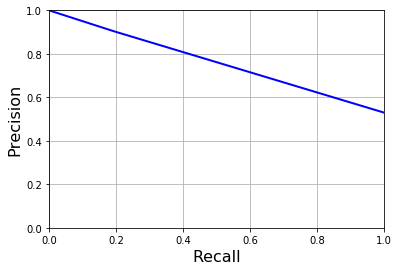

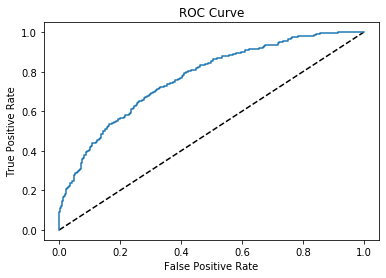

In [27]:
import pandas as pd
import sklearn
import numpy as np
from matplotlib import pyplot as plt
import pandas.util.testing as tm
from numpy.random import uniform
import catboost as cb
import gc
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK, STATUS_FAIL
from hyperopt.pyll.stochastic import sample
import warnings
from sklearn.metrics import accuracy_score,f1_score, precision_score,log_loss, recall_score,auc,precision_recall_curve, roc_auc_score, roc_curve,confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
import csv
from timeit import default_timer as timer
import random
from catboost import CatBoostClassifier
from catboost import *
from numpy.random import RandomState










__FILE_LOC = "c:/users/hajyhass/downloads/train_test_files_sample.csv"
df_train = pd.read_csv(__FILE_LOC,header=0)
df_reduced = df_train.drop(columns= ["0"])
data_selected= df_reduced[:][:]
labels_selected = df_train["0"][:]
indices = uniform(0,df_reduced.shape[0], 5000)
indices_list = [int(x) for x in indices]
sampled_data = df_reduced.iloc[indices_list,]
sampled_data=sampled_data.drop(columns='Unnamed: 0')
sampled_target = df_train["0"][indices_list] 
warnings.filterwarnings('ignore')
# making a smaller df for quick testing
df_s, _ = train_test_split(df_train, random_state = 30, train_size = 0.1)
train_X = sampled_data
train_y = sampled_target






class Tune_cat():
    def split(self, train_X, train_y):
        # Split into features and target
        ##y = train[target_name]
        ##X = train.drop(target_name, axis=1)
        # Split into train & validation set
        return train_test_split(train_X, train_y, train_size=0.8)
        
    def model_cat(self, X_train, y_train, X_val, y_val, space):

        model = CatBoostClassifier(depth=int(space['depth']),
                                   border_count=space['border_count'],
                                   l2_leaf_reg=space['l2_leaf_reg'],
                                   scale_pos_weight=space['scale_pos_weight'],
                                   task_type='CPU',  # change to GPU when working on Kaggle
                                   eval_metric='AUC',
                                   early_stopping_rounds=100,
                                   thread_count=-1)
        model.fit(X_train, y_train,
                  eval_set=(X_val, y_val), verbose=False, use_best_model=True)
        return model

    def tuning_hyperopt(self, X_train, y_train, X_val, y_val):
        space = {
            'depth': hp.quniform("depth", 1, 16, 1),
            'border_count': hp.quniform('border_count', 32, 255, 1),
            'l2_leaf_reg': hp.uniform('l2_leaf_reg', 3, 8),
            # Can be set only when loss_function is default Logloss
            'scale_pos_weight': hp.uniform('scale_pos_weight', 0.06, 1),
        }

        def hyperparameter_tuning(space):
            model = CatBoostClassifier(depth=int(space['depth']),
                                       border_count=space['border_count'],
                                       l2_leaf_reg=space['l2_leaf_reg'],
                                       scale_pos_weight=space['scale_pos_weight'],
                                       task_type='CPU',  # change to GPU when working on Kaggle
                                       eval_metric='AUC',
                                       early_stopping_rounds=100,
                                       thread_count=-1)

            model.fit(X_train, y_train, use_best_model=True,
                      verbose=False, eval_set=(X_val, y_val))

            preds_class = model.predict_proba(X_val)

            score = roc_auc_score(y_val, preds_class[:, 1])
            return{'loss': 1-score, 'status': STATUS_OK}

        best = fmin(fn=hyperparameter_tuning,
                    space=space,
                    algo=tpe.suggest,
                    max_evals=1)

        return best

    def performance(self, model, X_test, y_test):
        """
        Accepts a fitted model and an evaluation dataset at input.
        Prints the confusion matrix, classification_report & auc score. 
        Also, displays Precision-Recall curve & ROC curve.
        """

        # Make predictions on test set
        y_pred = model.predict(X_test)
        y_pred = np.round(y_pred)

        # Confusion matrix
        print(confusion_matrix(y_test, y_pred))

        # AUC score
        y_pred_prob = model.predict_proba(X_test)
        print("AUC score: ", roc_auc_score(y_test, y_pred_prob[:, 1]))

        # Logloss
        print("Logloss : ", log_loss(y_test, y_pred_prob))

        # Accuracy, Precision, Recall, F1 score
        print(classification_report(y_test, y_pred))

        # Precision-Recall curve
        precisions, recalls, thresholds = precision_recall_curve(
            y_test, y_pred)
        plt.plot(recalls, precisions, "b-", linewidth=2)
        plt.xlabel("Recall", fontsize=16)
        plt.ylabel("Precision", fontsize=16)
        plt.axis([0, 1, 0, 1])
        plt.grid(True)
        plt.show()

        # ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob[:, 1])
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label='Neural Network')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.show()

        
# Initialize class
tune_cat = Tune_cat()

# Split
X_train, X_val, y_train, y_val = tune_cat.split(train_X, train_y)

# Tune
space = tune_cat.tuning_hyperopt(X_train, y_train, X_val, y_val)

# Fit best model for validation
model = tune_cat.model_cat(X_train, y_train, X_val, y_val, space)

# Study best model performance
tune_cat.performance(model, X_val, y_val)

In [60]:
SEED=47
import optuna
import csv
from timeit import default_timer as timer
import random
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, accuracy_score, roc_auc_score, roc_curve, confusion_matrix, precision_recall_curve
from hyperopt import STATUS_OK, STATUS_FAIL, hp, tpe, Trials, fmin
import matplotlib.pyplot as plt


# # random search
# PARAM_GRID = {
#     'num_leaves': list(range(16, 196, 4)),
#     'max_bin': [254],
#     'lambda_l1': list(np.linspace(0, 1)),
#     'lambda_l2': list(np.linspace(0, 1)),
#     'min_data_in_leaf' : list(range(20, 500, 10)),
#     'class_weight': [None, 'balanced'],
#     'boosting_type': ['gbdt', 'goss'],
#     'learning_rate' : list(np.logspace(np.log(0.05), np.log(0.2), base=np.exp(1), num=1000)),
#     'feature_fraction': list(np.linspace(0.4, 1.0)),
#     'subsample_for_bin': list(range(20000, 300000, 20000)),
#     'bagging_freq': list(range(1, 7)),
#     'verbosity' : [0],
# }




# Hyperopt Space
H_SPACE = {
    'l2_leaf_reg': hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hp.uniform('learning_rate', 1e-3, 5e-1),
    'depth': hp.quniform('depth', 1, CB_MAX_DEPTH, 1),
    'loss_function': hp.choice('loss_function', ['Logloss']), # RMSE and #MAE and Poisson for regression
    'border_count': hp.quniform('border_count', 32, 255, 1),
    'bootstrap_type': hp.choice('bootstrap_type', 
        [{'bootstrap_type': 'Bayesian', 'bagging_temperature': hp.loguniform('bagging_temperature', np.log(1), np.log(50))},
         {'bootstrap_type': 'Bernoulli'}]),
    'grow_policy': hp.choice('grow_policy', 
        [{'grow_policy': 'SymmetricTree'}, {'grow_policy': 'Depthwise'},
         {'grow_policy': 'Lossguide', 'max_leaves': hp.quniform('max_leaves', 2, 32, 1)}]),
    'score_function': hp.choice('score_function', ['Cosine']),
    # The score type used to select the next split during the tree construction
    # 'score_function' = ['Correlation', 'L2', 'NewtonCorrelation', 'NewtonL2','LOOL2','Cosine','SatL2','SolarL2']
    # NewtonL2 is the only possible choice for Lossguide
    # The other choices explicitely belong to GPU, only 'Cosine' applies to CPU
    'eval_metric': hp.choice('eval_metric', ['F1']),
    # Eval_metric helps with detecting overfitting
    'min_data_in_leaf': hp.quniform('min_data_in_leaf', 1, 50, 1),
    'random_strength': hp.loguniform('random_strength', np.log(0.005), np.log(5)),
    'rsm': hp.uniform('rsm', 0.1, 1),
    # RSM :Random subspace method. The percentage of features to use at each split selection
    'od_type': hp.choice('od_type', ['IncToDec', 'Iter']),
    'task_type': 'CPU',
    # 'thread_count':-1
    'leaf_estimation_backtracking': hp.choice('leaf_estimation_backtracking', ['No', 'AnyImprovement']),
    #'boosting_type':hp.choice('boosting_type',['Ordered','Plain']), depends on symmetricality of the grow_policy
    #Ordered for small dataset requiring high accuracy, Plain for large data sets requiring processing speed
    
}


class Ctbclass():
    '''Parameter Tuning Class tunes the Catboost model with Hyperopt'''
    iteration = 0
    def __init__(self, x_train, y_train):
        '''Initializes the Parameter tuning class and also initializes Catboost dataset object
        Parameters
        ----------
        x_train: train data
        y_train: label data'''

        self.x_train = x_train
        self.y_train = y_train
        self.train_set = cb.Pool(self.x_train, self.y_train)
    def ctb_crossval(self, params, optim_type):
        '''lgb cross validation model
        Paramters
        ---------
        params: Hyper parameters in dict type from different optimization methods
        optim_type: choose among Optuna, Hyperopt, RandomSearch
        Returns
        ------
        Loss, params, n_estimator, run_time'''
        # initializing the timer
         
        start = timer()
#         if optim_type == 'Hyperopt':
#             cv_results = lgbo.cv(params, self.train_set, num_boost_round=NUM_BOOST_ROUNDS,
#                                  nfold=N_FOLDS, early_stopping_rounds=EARLY_STOPPING_ROUNDS,
#                                  metrics=['auc', 'binary', 'xentropy'], seed=SEED)
#       else:
        cv_results = cb.cv(self.train_set, params, fold_count=N_FOLDS, num_boost_round=NUM_BOOST_ROUNDS,
                           early_stopping_rounds=EARLY_STOPPING_ROUNDS, stratified=True, partition_random_seed=SEED,
                           plot=True)
        # store the runtime
        run_time = timer() - start

        # Extract the best score
        best_score = np.max(cv_results['test-F1-mean'])

        # Loss must be minimized
        loss = 1 - best_score

        # Boosting rounds that returned the highest cv score
        n_estimators = int(np.argmax(cv_results['test-F1-mean']) + 1)
        self.estimator = n_estimators
        return loss, params, n_estimators, run_time
    def parameter_tuning(self, tune_type):
        tuner = getattr(self, tune_type)
        return(tuner())
    def hyperopt_space(self):
        '''A method to call the hyperopt optimization for the data
        Parameters
        ----------
        fn_name: is the objective function to minimize defined with in the class function
        space: is dictionary type hypeorpt space over which the search is done
        algo: is the type of search algorithm
        trials: Hyperopt base trials object
        Returns
        -------
        result: best parameter that minimizes the fn_name over max_evals = MAX_EVALS FIXED FOR TESTING
        trials: the database in which to store all the point evaluations of the search'''
        fn_name, space, algo, trials='hyperopt_obj', H_SPACE, tpe.suggest, Trials()
        fn = getattr(self, fn_name)
        try:
            result = fmin(fn=fn, space=space, algo=algo, max_evals=MAX_EVALS,
                          trials=trials, rstate=np.random.RandomState(SEED))
        except Exception as e:
            return {'status': STATUS_FAIL, 'exception': str(e)}
        self.params = trials.best_trial['result']['params']
        self.params['n_estimators'] = self.estimator
        #print(result,trials)
        return result, trials
    def optuna_space(self):
        '''Optuna search space'''
        fn_name = 'optuna_obj'
        fn = getattr(self, fn_name)
        try:
            study = optuna.create_study(direction='minimize')
            study.optimize(fn, n_trials=MAX_EVALS)
        except Exception as e:
            return {'exception': str(e)}
        self.params = study.best_params
        self.params['n_estimator'] = self.estimator
        return study
    def hyperopt_obj(self, params):
        """Objective function for Gradient Boosting Machine Hyperparameter Optimization"""

        optim_type = 'Hyperopt'
        self.iteration += 1
         # Extract the bootstrap_type

        if params['bootstrap_type']['bootstrap_type'] == 'Bayesian':
            print(params['bootstrap_type'])
            params['bagging_temperature'] = params['bootstrap_type']['bagging_temperature']
            print(params['bagging_temperature'])
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])
        else:
            params['bootstrap_type'] = params['bootstrap_type']['bootstrap_type']
            print(params['bootstrap_type'])

        if params['grow_policy']['grow_policy'] == 'Lossguide':
            params['max_leaves'] = params['grow_policy']['max_leaves']
            print(params['max_leaves'])
            params['grow_policy'] = params['grow_policy']['grow_policy']
            score_function = 'NewtonL2'
            # when 'grow_policy' is set to 'lossguide', the only possible score_function is 'NewtonL2'
        else:
            params['grow_policy'] = params['grow_policy']['grow_policy']
            print(params['grow_policy'])

        # Make sure parameters that need to be integers are integers
        for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
            params[parameter_name] = int(params[parameter_name])
        
        
        # Perform n_folds cross validation
        loss, params, n_estimators, run_time = self.ctb_crossval(params, optim_type)

        # Dictionary with information for evaluation
        return {'loss':loss, 'params':params, 'iteration':self.iteration,
                'estimators':n_estimators, 'train_time':run_time, 'status':STATUS_OK}
    def optuna_obj(self, trial):
        '''Defining the parameters space inside the function for optuna optimization'''
        params={
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 0, 2, 1),
        'learning_rate': trial.suggest_uniform('learning_rate', 1e-3, 5e-1),
        'depth': trial.suggest_int('depth', 1, CB_MAX_DEPTH, 1),
        'loss_function': trial.suggest_categorical('loss_function', [None, 'Logloss']), # RMSE and #MAE and Poisson for regression
        'border_count': trial.suggest_int('border_count', 32, 255, 1),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type',['Bayesian','Bernoulli']), 
        'grow_policy': trial.suggest_categorical('grow_policy',['SymmetricTree', 'Depthwise','Lossguide']),
        'score_function': trial.suggest_categorical('score_function', [None, 'Cosine']),
        'eval_metric': trial.suggest_categorical('eval_metric', [None,'F1']),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50, 1),
        'random_strength': trial.suggest_uniform('random_strength', np.log(0.005), np.log(5)),
        'rsm': trial.suggest_uniform('rsm', 0.1, 1),
        'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
        'task_type': 'CPU',
        'leaf_estimation_backtracking': trial.suggest_categorical('leaf_estimation_backtracking', ['No', 'AnyImprovement'])
        }

        optim_type = 'Optuna'
        self.iteration += 1

        # Perform n_folds cross validation
        if params['grow_policy'] == 'lossguide':
            params['max_leaves'] = trial.suggest_int('max_leaves', 2, 32)
            params['score_function'] = 'NewtonL2'
        
        if params['bootstrap_type'] == 'Bayesian':
            params['bagging_temperature'] = trial.suggest_uniform('bagging_temperature',np.log(1), np.log(50))
            
        #for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
         #   params[parameter_name] = int(params[parameter_name])
        

        loss, params, _, _ = self.ctb_crossval(params, optim_type)

        return loss
    
    def train(self, x_test, y_test):
        """This function evaluates the model on paramters and estimators
        Parameters
        ----------
        x_test: test set; y_test: test label"""
        
        for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
            self.params[parameter_name] = int(self.params[parameter_name])
            
        
        self.gbm = cb.train(params=self.params, pool=self.train_set)
        self.pred = self.gbm.predict(x_test)
        self.test_y = y_test
        print("Model will be trained with best parameters obtained from Hyperopt ... \n\n\n")
        print("Model trained with {} estimators on the following parameters: \n{}".format(self.estimator, self.params))
        
    def evaluate(self):
        """This function generates the evaluation report for the model"""
        pred = self.pred
        print('check pred')
        (self.fpr, self.tpr, self.thresholds) = roc_curve(y_true=self.test_y, y_score=pred)
        print('fpr, tpr, thresh check')
        self.fnr = 1- self.tpr
        print('fnr check')
        self.roc_auc = auc(self.fpr, self.tpr)
        print('roc_Auc check')
        self.precision, self.recall, _ = precision_recall_curve(self.test_y, pred)
        print('precision recall check')
        self.pr_auc = auc(self.recall, self.precision)
        print('pr_acu check')
        eval_list = ['roc', 'prcurve', 'fpr_fnr']
        for eval_name in eval_list:
            func = getattr(self,eval_name)
            func()
        else:
            print('Not valid evaluation type')

#     def feature_importance(self):
#         print('Plotting feature importances...')
#         ax = cb.plot_importance(self.gbm, max_num_features=10)
#         plt.savefig('feature_importance.png')
        

    def roc(self):
        fpr, tpr, roc = self.fpr, self.tpr, self.roc_auc

        plt.figure(figsize=(16, 8))
        lw = 2

        plt.plot(fpr, tpr, color='darkorange',
                 lw=lw, label='ROC curve (area = %0.2f)' % self.roc_auc, alpha=0.5)

        plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', alpha=0.5)

        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.grid(True)
        plt.xlabel('False Positive Rate', fontsize=16)
        plt.ylabel('True Positive Rate', fontsize=16)
        plt.title('Receiver operating characteristic', fontsize=20)
        plt.legend(loc="lower right", fontsize=16)
        plt.savefig('roc.png')
        
    def prcurve(self):
        test_y=self.test_y
        recall, precision, pr_auc = self.recall, self.precision, self.pr_auc
        # plot the precision-recall curves
        no_skill = len(test_y[test_y==1]) / len(test_y)
        plt.figure(figsize = (16,8))
        plt.plot([0, 1], [no_skill, no_skill], color='navy', linestyle='--',
                 alpha=0.5)
        plt.plot(recall, precision, color='darkorange',
                 label='ROC curve (area = %0.2f)'% pr_auc, alpha=0.5)
        # axis labels
        plt.title('Precision Recall Curve', size = 20)
        plt.xlabel('Recall', fontsize=16)
        plt.ylabel('Precision', fontsize=16)
        plt.grid(True)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        # show the legend
        plt.legend(fontsize=16)
        plt.savefig('prcurve.png')
    
    def fpr_fnr(self):
        lw = 2
        fpr, fnr, thresholds = self.fpr, self.fnr, self.thresholds
        plt.figure(figsize = (16,8))
        plt.plot(thresholds, fpr, color='blue', lw=lw, label='FPR', alpha=0.5)
        plt.plot(thresholds, fnr, color='green', lw=lw, label='FNR', alpha=0.5)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.grid(True)
        plt.xlabel('Threshold', fontsize=16)
        plt.ylabel('Error Rate', fontsize=16)
        plt.title('FPR-FNR curves', fontsize=20)
        plt.legend(loc="lower left", fontsize=16)
        plt.savefig('fpr-fnr.png')
        
obj= Ctbclass(train_X, train_y)
obj.optuna_space()
#obj.hyperopt_space()
#obj.train(train_X,train_y)
#obj.evaluate()


        

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[W 2020-04-17 14:36:02,854] Setting status of trial#0 as TrialState.FAIL because of the following error: CatBoostError('c:/program files (x86)/go agent/pipelines/buildmaster/catboost.git/library/json/writer/json_value.cpp:457: Not a string')
Traceback (most recent call last):
  File "C:\Users\hajyhass\Anaconda3\lib\site-packages\optuna\study.py", line 677, in _run_trial
    result = func(trial)
  File "<ipython-input-60-592289698bde>", line 224, in optuna_obj
    loss, params, _, _ = self.ctb_crossval(params, optim_type)
  File "<ipython-input-60-592289698bde>", line 99, in ctb_crossval
    plot=True)
  File "C:\Users\hajyhass\Anaconda3\lib\site-packages\catboost\core.py", line 4928, in cv
    as_pandas, folds, type)
  File "_catboost.pyx", line 4708, in _catboost._cv
  File "_catboost.pyx", line 4736, in _catboost._cv
_catboost.CatBoostError: c:/program files (x86)/go agent/pipelines/buildmaster/catboost.git/library/json/writer/json_value.cpp:457: Not a string


{'exception': 'c:/program files (x86)/go agent/pipelines/buildmaster/catboost.git/library/json/writer/json_value.cpp:457: Not a string'}

In [35]:
train_set_sample = cb.Pool(train_X, train_y)
parameters_sample={'bootstrap_type': 'Bernoulli', 'border_count': 227, 'depth': 13, 'grow_policy': 'Lossguide', 'l2_leaf_reg': 4, 'leaf_estimation_backtracking': 'No', 'learning_rate': 0.10504769712780566, 'loss_function': 'Logloss', 'max_leaves': 11, 'min_data_in_leaf': 24, 'od_type': 'Iter', 'random_strength': 0.28353426477946886}

In [44]:
samp_mod=cb.train(params=parameters_sample,pool=train_set_sample)

0:	learn: 0.6788953	total: 9.65ms	remaining: 9.64s
1:	learn: 0.6665987	total: 22.3ms	remaining: 11.1s
2:	learn: 0.6560683	total: 34.9ms	remaining: 11.6s
3:	learn: 0.6463318	total: 46.6ms	remaining: 11.6s
4:	learn: 0.6389199	total: 56.3ms	remaining: 11.2s
5:	learn: 0.6337280	total: 64.8ms	remaining: 10.7s
6:	learn: 0.6279850	total: 73.9ms	remaining: 10.5s
7:	learn: 0.6229116	total: 82.7ms	remaining: 10.3s
8:	learn: 0.6173581	total: 93.2ms	remaining: 10.3s
9:	learn: 0.6119307	total: 104ms	remaining: 10.3s
10:	learn: 0.6053793	total: 113ms	remaining: 10.2s
11:	learn: 0.6010572	total: 122ms	remaining: 10.1s
12:	learn: 0.5972703	total: 132ms	remaining: 10.1s
13:	learn: 0.5931289	total: 173ms	remaining: 12.2s
14:	learn: 0.5902445	total: 183ms	remaining: 12s
15:	learn: 0.5866088	total: 194ms	remaining: 11.9s
16:	learn: 0.5837765	total: 223ms	remaining: 12.9s
17:	learn: 0.5797228	total: 233ms	remaining: 12.7s
18:	learn: 0.5761533	total: 242ms	remaining: 12.5s
19:	learn: 0.5745012	total: 254ms	

161:	learn: 0.4255801	total: 1.99s	remaining: 10.3s
162:	learn: 0.4246964	total: 2s	remaining: 10.3s
163:	learn: 0.4239783	total: 2.01s	remaining: 10.3s
164:	learn: 0.4232937	total: 2.02s	remaining: 10.2s
165:	learn: 0.4226100	total: 2.04s	remaining: 10.3s
166:	learn: 0.4218686	total: 2.05s	remaining: 10.2s
167:	learn: 0.4213102	total: 2.06s	remaining: 10.2s
168:	learn: 0.4207007	total: 2.08s	remaining: 10.2s
169:	learn: 0.4201043	total: 2.09s	remaining: 10.2s
170:	learn: 0.4192936	total: 2.1s	remaining: 10.2s
171:	learn: 0.4187762	total: 2.11s	remaining: 10.1s
172:	learn: 0.4181324	total: 2.12s	remaining: 10.1s
173:	learn: 0.4173728	total: 2.13s	remaining: 10.1s
174:	learn: 0.4165106	total: 2.14s	remaining: 10.1s
175:	learn: 0.4158445	total: 2.15s	remaining: 10.1s
176:	learn: 0.4150502	total: 2.16s	remaining: 10s
177:	learn: 0.4145740	total: 2.18s	remaining: 10.1s
178:	learn: 0.4140723	total: 2.19s	remaining: 10.1s
179:	learn: 0.4134778	total: 2.21s	remaining: 10.1s
180:	learn: 0.4126

320:	learn: 0.3352271	total: 3.88s	remaining: 8.21s
321:	learn: 0.3346106	total: 3.89s	remaining: 8.2s
322:	learn: 0.3342328	total: 3.9s	remaining: 8.19s
323:	learn: 0.3335954	total: 3.92s	remaining: 8.18s
324:	learn: 0.3329694	total: 3.93s	remaining: 8.16s
325:	learn: 0.3324961	total: 3.94s	remaining: 8.16s
326:	learn: 0.3320876	total: 3.96s	remaining: 8.14s
327:	learn: 0.3316557	total: 3.97s	remaining: 8.13s
328:	learn: 0.3309707	total: 3.98s	remaining: 8.12s
329:	learn: 0.3305963	total: 4s	remaining: 8.11s
330:	learn: 0.3301718	total: 4s	remaining: 8.09s
331:	learn: 0.3298806	total: 4.02s	remaining: 8.08s
332:	learn: 0.3294191	total: 4.03s	remaining: 8.07s
333:	learn: 0.3290070	total: 4.04s	remaining: 8.06s
334:	learn: 0.3285281	total: 4.06s	remaining: 8.07s
335:	learn: 0.3280994	total: 4.07s	remaining: 8.05s
336:	learn: 0.3277028	total: 4.08s	remaining: 8.03s
337:	learn: 0.3273225	total: 4.09s	remaining: 8.02s
338:	learn: 0.3269843	total: 4.1s	remaining: 8s
339:	learn: 0.3264052	to

479:	learn: 0.2681119	total: 6.55s	remaining: 7.09s
480:	learn: 0.2677081	total: 6.59s	remaining: 7.11s
481:	learn: 0.2673521	total: 6.6s	remaining: 7.09s
482:	learn: 0.2670599	total: 6.61s	remaining: 7.08s
483:	learn: 0.2666878	total: 6.64s	remaining: 7.08s
484:	learn: 0.2664416	total: 6.65s	remaining: 7.06s
485:	learn: 0.2661542	total: 6.67s	remaining: 7.05s
486:	learn: 0.2658644	total: 6.69s	remaining: 7.05s
487:	learn: 0.2655407	total: 6.7s	remaining: 7.03s
488:	learn: 0.2651453	total: 6.71s	remaining: 7.01s
489:	learn: 0.2649086	total: 6.72s	remaining: 7s
490:	learn: 0.2645798	total: 6.73s	remaining: 6.98s
491:	learn: 0.2643170	total: 6.74s	remaining: 6.96s
492:	learn: 0.2640606	total: 6.75s	remaining: 6.94s
493:	learn: 0.2635190	total: 6.76s	remaining: 6.92s
494:	learn: 0.2631606	total: 6.77s	remaining: 6.9s
495:	learn: 0.2628413	total: 6.78s	remaining: 6.89s
496:	learn: 0.2625573	total: 6.79s	remaining: 6.87s
497:	learn: 0.2622590	total: 6.8s	remaining: 6.85s
498:	learn: 0.26203

638:	learn: 0.2169252	total: 8.47s	remaining: 4.78s
639:	learn: 0.2167551	total: 8.47s	remaining: 4.77s
640:	learn: 0.2165821	total: 8.48s	remaining: 4.75s
641:	learn: 0.2163658	total: 8.49s	remaining: 4.74s
642:	learn: 0.2160039	total: 8.5s	remaining: 4.72s
643:	learn: 0.2157132	total: 8.51s	remaining: 4.7s
644:	learn: 0.2154601	total: 8.52s	remaining: 4.69s
645:	learn: 0.2150976	total: 8.53s	remaining: 4.67s
646:	learn: 0.2149228	total: 8.54s	remaining: 4.66s
647:	learn: 0.2144833	total: 8.56s	remaining: 4.65s
648:	learn: 0.2141026	total: 8.57s	remaining: 4.63s
649:	learn: 0.2138465	total: 8.58s	remaining: 4.62s
650:	learn: 0.2136317	total: 8.6s	remaining: 4.61s
651:	learn: 0.2133578	total: 8.61s	remaining: 4.59s
652:	learn: 0.2129367	total: 8.62s	remaining: 4.58s
653:	learn: 0.2126166	total: 8.64s	remaining: 4.57s
654:	learn: 0.2123461	total: 8.65s	remaining: 4.56s
655:	learn: 0.2120125	total: 8.66s	remaining: 4.54s
656:	learn: 0.2116977	total: 8.67s	remaining: 4.53s
657:	learn: 0.2

797:	learn: 0.1767550	total: 10.4s	remaining: 2.64s
798:	learn: 0.1765014	total: 10.5s	remaining: 2.63s
799:	learn: 0.1761794	total: 10.5s	remaining: 2.62s
800:	learn: 0.1758586	total: 10.5s	remaining: 2.6s
801:	learn: 0.1755969	total: 10.5s	remaining: 2.59s
802:	learn: 0.1753476	total: 10.5s	remaining: 2.58s
803:	learn: 0.1751398	total: 10.5s	remaining: 2.56s
804:	learn: 0.1749231	total: 10.5s	remaining: 2.55s
805:	learn: 0.1747522	total: 10.5s	remaining: 2.53s
806:	learn: 0.1745449	total: 10.5s	remaining: 2.52s
807:	learn: 0.1743370	total: 10.6s	remaining: 2.51s
808:	learn: 0.1741088	total: 10.6s	remaining: 2.49s
809:	learn: 0.1737750	total: 10.6s	remaining: 2.48s
810:	learn: 0.1735959	total: 10.6s	remaining: 2.47s
811:	learn: 0.1733462	total: 10.6s	remaining: 2.45s
812:	learn: 0.1731592	total: 10.6s	remaining: 2.44s
813:	learn: 0.1728456	total: 10.6s	remaining: 2.42s
814:	learn: 0.1725663	total: 10.6s	remaining: 2.41s
815:	learn: 0.1723336	total: 10.6s	remaining: 2.4s
816:	learn: 0.

956:	learn: 0.1441460	total: 12.6s	remaining: 567ms
957:	learn: 0.1439996	total: 12.6s	remaining: 554ms
958:	learn: 0.1437810	total: 12.6s	remaining: 541ms
959:	learn: 0.1435168	total: 12.7s	remaining: 528ms
960:	learn: 0.1433893	total: 12.7s	remaining: 514ms
961:	learn: 0.1432286	total: 12.7s	remaining: 501ms
962:	learn: 0.1430848	total: 12.7s	remaining: 488ms
963:	learn: 0.1428309	total: 12.7s	remaining: 474ms
964:	learn: 0.1426625	total: 12.7s	remaining: 462ms
965:	learn: 0.1425292	total: 12.7s	remaining: 448ms
966:	learn: 0.1423668	total: 12.8s	remaining: 435ms
967:	learn: 0.1421758	total: 12.8s	remaining: 422ms
968:	learn: 0.1419283	total: 12.8s	remaining: 409ms
969:	learn: 0.1417354	total: 12.8s	remaining: 395ms
970:	learn: 0.1415867	total: 12.8s	remaining: 382ms
971:	learn: 0.1413689	total: 12.8s	remaining: 369ms
972:	learn: 0.1412168	total: 12.8s	remaining: 356ms
973:	learn: 0.1409833	total: 12.8s	remaining: 342ms
974:	learn: 0.1408428	total: 12.8s	remaining: 329ms
975:	learn: 

In [50]:
samp_mod.feature_importances_

TypeError: 'module' object is not callable

check pred
fpr, tpr, thresh check
fnr check
roc_Auc check
precision recall check
pr_acu check


NameError: name 'test_y' is not defined

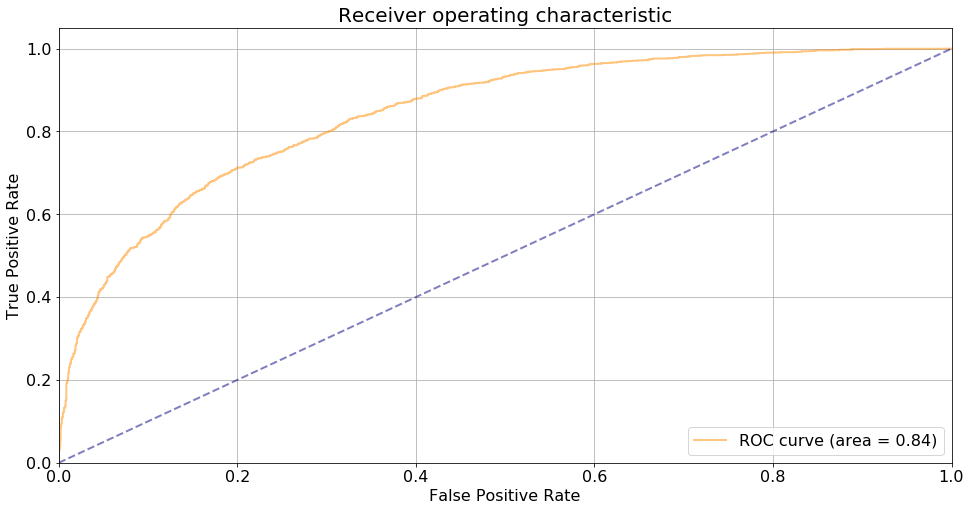

In [53]:
obj.evaluate()

In [55]:
%pwd

'C:\\Users\\hajyhass'

In [ ]:
def objective(trial):
    
    dtrain = lgbo.Dataset(train_X, label=train_y)

    global ITERATION_O

    ITERATION_O += 1
    params={
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 0, 2, 1),
        'learning_rate': trial.suggest_uniform('learning_rate', 1e-3, 5e-1),
        'depth': trial.suggest_int('depth', 1, CB_MAX_DEPTH, 1),
        'loss_function': trial.suggest_categorical('loss_function', [None, 'Logloss']), # RMSE and #MAE and Poisson for regression
        'border_count': trial.suggest_int('border_count', 32, 255, 1),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type',['Bayesian','Bernoulli']), 
        'grow_policy': trial.suggest_categorical('grow_policy',['SymmetricTree', 'Depthwise','Lossguide']),
        'score_function': trial.suggest_categorical('score_function', [None, 'Cosine']),
        'eval_metric': trial.suggest_categorical('eval_metric', [None,'F1']),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50, 1),
        'random_strength': trial.suggest_uniform('random_strength', np.log(0.005), np.log(5)),
        'rsm': trial.suggest_uniform('rsm', 0.1, 1),
        'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
        'task_type': 'CPU',
        'leaf_estimation_backtracking': trial.suggest_categorical('leaf_estimation_backtracking', ['No', 'AnyImprovement'])
        }
    
    
    optim_type = 'Optuna'
        self.iteration += 1

        # Perform n_folds cross validation
        if params['grow_policy'] == 'lossguide':
            params['max_leaves'] = trial.suggest_int('max_leaves', 2, 32)
            params['score_function'] = 'NewtonL2'
        
        if params['bootstrap_type'] == 'Bayesian':
            params['bagging_temperature'] = trial.suggest_uniform('bagging_temperature',np.log(1), np.log(50))
            
        #for parameter_name in ['l2_leaf_reg', 'depth', 'border_count']:
         #   params[parameter_name] = int(params[parameter_name])
        

        loss, params, _, _ = self.ctb_crossval(params, optim_type)

        return loss
    
    
    
    
    
    start = timer()

    
    
    cv_results = lgb.cv(param, dtrain, num_boost_round = 10000, nfold = 3, 
                        early_stopping_rounds = 100, metrics = ['auc','binary','xentropy'], 
                        seed = 50,
                        )
    
    run_time = timer() - start
    
    # Extract the best score
    best_score = np.max(cv_results['auc-mean'])

    loss = 1 - best_score

    # Boosting rounds that returned the highest cv score
    n_estimators = int(np.argmax(cv_results['auc-mean']) + 1)

    # Write to the csv file ('a' means append)
    of_connection = open(out_file, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([loss, param, ITERATION_O, n_estimators, run_time])

    
    return loss

# Global variable
global  ITERATION_O

ITERATION_O = 0

# File to save first results

out_file = 'gbm_optuna.csv'
of_connection = open(out_file, 'w')
writer = csv.writer(of_connection)

# Write the headers to the file
writer.writerow(['loss', 'params', 'iteration', 'estimators', 'train_time'])
of_connection.close()

study = optuna.create_study(direction='minimize')

study.optimize(objective, n_trials=100)